In [2]:
import pandas as pd
import numpy as np

# utility
from sklearn.base import clone
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils.class_weight import compute_class_weight
from tabulate import tabulate

#viz
import seaborn as sns
import matplotlib.pyplot as plt
# from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

# parallel
import ray

try:
    ray.shutdown()
except:
    print("ray not started")

ray.init()

from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, RobustScaler, MaxAbsScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedShuffleSplit, LeaveOneOut, KFold
from scipy.stats import loguniform
from imblearn.under_sampling import RandomUnderSampler
# from mlxtend.feature_selection import SequentialFeatureSelector, ExhaustiveFeatureSelector
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel
from sklearn.decomposition import PCA, NMF
# from mlxtend.feature_selection import SequentialFeatureSelector
# from tensorflow.keras.callbacks import EarlyStopping

# models
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression, ElasticNet, RidgeClassifier, LinearRegression
from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from lightgbm import LGBMClassifier
from lineartree import LinearTreeClassifier, LinearForestClassifier, LinearBoostClassifier


# analysis
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, f1_score

pd.set_option('display.max_colwidth', None)
pd.set_option("display.max_columns", None) # show all cols

# from data_cleaning import clean_raw_data, create_dataset, get_all_results

from data_cleaning import clean_raw_data, create_dataset
from sklearn.ensemble import ExtraTreesClassifier
from mango import Tuner

RESULTS_DIR = "results/"
DATA_DIR = "data/"
SEED = 42

# reload modules in py files
%load_ext autoreload
%autoreload 2

2023-04-20 16:18:36,364	INFO worker.py:1553 -- Started a local Ray instance.


### install any packages here 

In [35]:
!pip install linear-tree

  Using cached linear_tree-0.3.5-py3-none-any.whl (21 kB)


In [78]:
!pip uninstall --yes mlxtend

Found existing installation: mlxtend 0.22.0
Uninstalling mlxtend-0.22.0:
  Successfully uninstalled mlxtend-0.22.0


## clean dataset using functions in src/data_cleaning.py

In [3]:


X, y = create_dataset(clean_raw_data(f"../{DATA_DIR}Brdi_db_march.xlsx"), target_col="NHL")
print("No missing values in X: ", (X.isna().sum() == 0).all())
print("No missing values in y: ", (y.isna().sum() == 0).all())
print(X.columns)
display(X.head(5),X.shape ,y.head(5), y.shape)

print(y.value_counts())

/home/mmoschit/Concussions-and-Athletic-Performance/src
No missing values in X:  True
No missing values in y:  True
Index(['age', 'concussions', 'weight', 'bimanualscore_washer', 'RT_V', 'RT_HR',
       'Delta_RT', 'MT_V', 'MT_HR', 'Delta_MT', 'TMT_V', 'TMT_HR', 'CMT_V',
       'CMT_HR', 'cvRT_V', 'cvRT_HR', 'stdRT_V', 'stdRT_HR', 'BallPath_V',
       'BallPath_HR', 'FullPath_V', 'FullPath_HR', 'Delta_Fullpath',
       'Corrective_V', 'Corrective_HR', 'PeakV_V', 'PeakV_HR', 'Delta_PV',
       'AE_V', 'AE_HR', 'Delta_AE', 'VE_V', 'VE_HR', 'AbsOnAxis_HR',
       'Delta_OnAxis', 'AbsOffAxis_V', 'AbsOffAxis_HR', 'Delta_OffAxis',
       'AbsOnAxis_V'],
      dtype='object')


,age,concussions,weight,bimanualscore_washer,RT_V,RT_HR,Delta_RT,MT_V,MT_HR,Delta_MT,TMT_V,TMT_HR,CMT_V,CMT_HR,cvRT_V,cvRT_HR,stdRT_V,stdRT_HR,BallPath_V,BallPath_HR,FullPath_V,FullPath_HR,Delta_Fullpath,Corrective_V,Corrective_HR,PeakV_V,PeakV_HR,Delta_PV,AE_V,AE_HR,Delta_AE,VE_V,VE_HR,AbsOnAxis_HR,Delta_OnAxis,AbsOffAxis_V,AbsOffAxis_HR,Delta_OffAxis,AbsOnAxis_V
0,18,1.0,193,20.54,426.570000,680.8300,254.26,241.7300,895.6200,653.90,285.4000,1200.6900,43.67,305.07,0.10,0.21,42.79,140.47,64.82,66.62,70.00,77.51,7.50,5.18,10.89,211.89,64.68,-147.21,9.71,15.44,5.73,5.02,8.77,10.940000,2.92,3.790000,7.560000,3.77,8.010000
2,18,1.0,196,20.20,398.272727,541.1175,142.84,259.1539,222.6922,-36.46,265.3636,249.5000,6.21,26.81,0.09,0.28,34.58,151.09,69.48,62.36,69.73,73.17,3.44,0.25,10.81,195.69,238.35,42.66,5.22,6.07,0.84,4.13,0.83,11.610000,8.50,1.940000,0.790000,-1.15,3.110000
3,18,1.0,178,17.20,663.000000,1279.9670,616.97,311.8333,578.4696,266.64,371.2000,912.7325,59.37,334.26,0.92,0.82,609.51,1051.09,69.52,64.02,69.52,79.74,10.22,0.00,15.72,457.96,128.81,-329.16,3.96,12.62,8.66,0.94,5.22,13.250000,10.11,1.580000,8.260000,6.67,3.140000
4,18,1.0,202,24.00,490.080000,767.1300,277.06,204.8800,300.9600,96.07,208.7100,760.9400,3.83,459.98,0.08,0.12,38.93,92.45,66.88,65.63,69.12,81.85,12.73,2.24,16.22,250.68,195.37,-55.30,8.99,13.42,4.42,2.35,8.92,8.597285,1.15,1.791101,6.231146,4.44,7.447210
5,18,1.0,220,20.00,340.120000,614.8100,274.69,161.1400,163.4500,2.31,350.9500,161.4600,189.80,-1.99,0.12,0.04,41.03,25.22,65.26,68.21,69.27,68.21,-1.06,4.01,0.00,318.08,368.13,50.05,11.48,5.24,-6.24,9.66,0.00,5.731523,0.55,3.657617,2.941176,-0.72,5.184766


(117, 39)

0    0
2    0
3    0
4    0
5    0
Name: NHL, dtype: int64

(117,)

1    69
0    48
Name: NHL, dtype: int64


In [4]:
sampler = RandomUnderSampler(random_state=42, sampling_strategy={0 : 48, 1 : 47})
X, y = sampler.fit_resample(X, y)

print(X.shape, y.shape, y.value_counts())

(95, 39) (95,) 0    48
1    47
Name: NHL, dtype: int64


## Model Tuning

1. Take best features from feature selection 
2. Tune model using best features 


In [5]:
class NamedFeatureSelector(object):

    def __init__(self, column_names):
        all_col_names = ['age', 'concussions', 'weight',
        'bimanualscore_washer', 'RT_V', 'RT_HR', 'Delta_RT', 'MT_V', 'MT_HR',
        'Delta_MT', 'TMT_V', 'TMT_HR', 'CMT: V', 'CMT: HR', 'cvRT_V', 'cvRT_HR',
        'stdRT_V', 'stdRT_HR', 'Ball Path_V', 'Ball Path_HR', 'FullPath_V',
        'FullPath_HR', 'Delta_Fullpath', 'Corrective_V', 'Corrective_HR',
        'PeakV_V', 'PeakV_HR', 'Delta_PV', 'AE_V', 'AE_HR', 'Delta_AE', 'VE_V',
        'VE_HR', 'AbsOnAxis_HR', 'Delta_OnAxis', 'AbsOffAxis_V',
        'AbsOffAxis_HR', 'Delta_OffAxis', 'AbsOnAxis_V'
        ]

        self.column_names = column_names
        self.column_idx = [all_col_names.index(col_name) for col_name in column_names]

    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            X = X.iloc[:, self.column_idx]
            return X.to_numpy()
        else:
            X = X[:, self.column_idx]
            return X
    
    def fit(self, X, y=None):
        return self
    
        
    
    
    
# features_sel = NamedFeatureSelector(["age as of June 1", '# of concussions', 'weight'])
# X, y = create_dataset(clean_raw_data("Brdi_db_march.xlsx"), target_col="NHL")
# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.1, random_state=1, stratify=y)
# display(X_train)
# features_sel.transform(X_train)

Dimensionality Reduction using Principle component analysis

Not used but interesting ex

/home/mmoschit/Concussions-and-Athletic-Performance/src


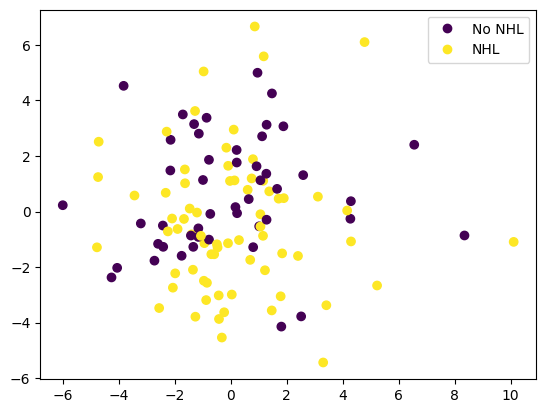

In [6]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

X, y = create_dataset(clean_raw_data(f"../{DATA_DIR}Brdi_db_march.xlsx"), target_col="NHL")
pca = PCA(n_components=.8, random_state=SEED)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])
Xt = pipe.fit_transform(X)
plot = plt.scatter(Xt[:,0], Xt[:,1], c=y)
plt.legend(handles=plot.legend_elements()[0], labels=['No NHL', 'NHL'])
plt.show()

## function to get different types of cross validation

In [7]:
def get_cross_validation(X, y, test_size=.2, n_splits=10, type="stratified", random_state=SEED):
    if type == "stratified":
        return list(StratifiedShuffleSplit(test_size=test_size, n_splits=n_splits, random_state=random_state).split(X, y))
    elif type == "leave_one_out":
        return list(LeaveOneOut().split(X, y))
    elif type=="K-Fold":
        return list(KFold(n_splits=n_splits, random_state=random_state, shuffle=True).split(X, y))

In [8]:
def seaborn_conf_matrix(cm, model_name, result_dir="../figures/confusion_matricies"):
    plt.figure()
    plt.title(f"{model_name} Confusion Matrix")
    group_names = ["True Neg","False Pos","False Neg","True Pos"]
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.savefig(f"{result_dir}/{model_name}_conf_matrix.png")

## Tune SVM

In [9]:
def graph_cv_results(results_df):
    plt.figure()
    # Plot loss scores using seaborn
    
    plt.xticks(rotation=90)
    sns.lineplot(data=results_df, x='params', y='mean_train_score', label='CV Training Score')
    sns.lineplot(data=results_df, x='params', y='mean_test_score', label='CV Test Score')
    plt.xlabel('')
    plt.xticks(ticks=[], labels=[])

In [10]:
from sklearn.metrics import make_scorer

def scorer(*args):
    print(args)
    y_pred = clf.predict(X)
    score = f1_score(y, y_pred)
#     return score
    return 1


overfitting_scorer = make_scorer(scorer, greater_is_better=True)

In [42]:
def create_classification_report_DF(y_true, y_pred):
    report = classification_report(y_true, y_pred, output_dict=True, zero_division=0)

    report_df = pd.DataFrame(report).transpose()

    return report_df


create_classification_report_DF(list([0,0,0,0,0,0,0,0]), list([1,1,1,1,1,1,1,1]))

,precision,recall,f1-score,support
0,0.0,0.0,0.0,8.0
1,0.0,0.0,0.0,0.0
accuracy,0.0,0.0,0.0,0.0
macro avg,0.0,0.0,0.0,8.0
weighted avg,0.0,0.0,0.0,8.0


In [117]:
def create_train_report_df(cv_results, col_to_find_rank):
    train_report_df = cv_results
    all_cols = []
    
    mean_cols = list(filter(lambda col: "rank" in col, list(train_report_df.columns)))
    all_cols.extend(mean_cols)
    
    
    train_report_df = train_report_df[all_cols]
#     print(list(train_report_df.columns))
#     train_report_df = train_report_df.reindex(sorted(train_report_df.columns), axis=1)
#     train_report_df.sort_index(axis=1, inplace=True)
#     return train_report_df[all_cols].mean()
#     f1_cols = list(filter(lambda col: "F1" in col, list(train_report_df.columns)))
    return train_report_df

create_train_report_df(pd.read_excel("cv_results.xlsx", index_col=0), "")

,rank_test_F1_unweighted,rank_test_F1_weighted,rank_test_F1_0,rank_test_F1_1,rank_test_Precision_unweighted,rank_test_Precision_weighted,rank_test_Precision_0,rank_test_Precision_1,rank_test_Recall_unweighted,rank_test_Recall_weighted,rank_test_Recall_0,rank_test_Recall_1
0,11,11,11,11,16,8,16,16,6,8,6,6
1,24,21,12,24,17,21,17,17,20,20,20,20
2,1,2,4,1,7,5,7,7,3,2,3,3
3,6,3,1,6,1,1,1,1,20,2,20,20
4,22,23,23,22,23,23,23,23,11,23,11,11
5,12,18,17,12,9,10,9,9,6,14,6,6
6,4,8,20,4,15,15,15,15,1,8,1,1
7,10,7,6,10,6,6,6,6,20,13,20,20
8,22,23,23,22,23,23,23,23,11,23,11,11
9,12,18,17,12,9,10,9,9,6,14,6,6


In [115]:
def create_train_report_df(cv_results):
    train_report_df = cv_results
    all_cols = []
    
#     non_scoring_cols = ["best_params_", ]
#     all_cols.extend(non_scoring_cols)
    
#     keep only mean col
    mean_cols = list(filter(lambda col: "mean" in col, list(train_report_df.columns)))
    all_cols.extend(mean_cols)
    
    non_std_cols = list(filter(lambda col: "std" not in col, list(train_report_df.columns)))
    all_cols.extend(non_std_cols)
    
    train_report_df = train_report_df[all_cols].mean().to_frame().transpose()
#     print(list(train_report_df.columns))
#     train_report_df = train_report_df.reindex(sorted(train_report_df.columns), axis=1)
#     train_report_df.sort_index(axis=1, inplace=True)
#     return train_report_df[all_cols].mean()
#     f1_cols = list(filter(lambda col: "F1" in col, list(train_report_df.columns)))
    return train_report_df

create_train_report_df(pd.read_excel("cv_results.xlsx", index_col=0))

,mean_fit_time,mean_score_time,mean_test_F1_unweighted,mean_train_F1_unweighted,mean_test_F1_weighted,mean_train_F1_weighted,mean_test_F1_0,mean_train_F1_0,mean_test_F1_1,mean_train_F1_1,mean_test_Precision_unweighted,mean_train_Precision_unweighted,mean_test_Precision_weighted,mean_train_Precision_weighted,mean_test_Precision_0,mean_train_Precision_0,mean_test_Precision_1,mean_train_Precision_1,mean_test_Recall_unweighted,mean_train_Recall_unweighted,mean_test_Recall_weighted,mean_train_Recall_weighted,mean_test_Recall_0,mean_train_Recall_0,mean_test_Recall_1,mean_train_Recall_1,mean_fit_time,mean_score_time,param_model__l1_ratio,split0_test_F1_unweighted,split1_test_F1_unweighted,split2_test_F1_unweighted,split3_test_F1_unweighted,split4_test_F1_unweighted,split5_test_F1_unweighted,split6_test_F1_unweighted,split7_test_F1_unweighted,split8_test_F1_unweighted,split9_test_F1_unweighted,mean_test_F1_unweighted,rank_test_F1_unweighted,split0_train_F1_unweighted,split1_train_F1_unweighted,split2_train_F1_unweighted,split3_train_F1_unweighted,split4_train_F1_unweighted,split5_train_F1_unweighted,split6_train_F1_unweighted,split7_train_F1_unweighted,split8_train_F1_unweighted,split9_train_F1_unweighted,mean_train_F1_unweighted,split0_test_F1_weighted,split1_test_F1_weighted,split2_test_F1_weighted,split3_test_F1_weighted,split4_test_F1_weighted,split5_test_F1_weighted,split6_test_F1_weighted,split7_test_F1_weighted,split8_test_F1_weighted,split9_test_F1_weighted,mean_test_F1_weighted,rank_test_F1_weighted,split0_train_F1_weighted,split1_train_F1_weighted,split2_train_F1_weighted,split3_train_F1_weighted,split4_train_F1_weighted,split5_train_F1_weighted,split6_train_F1_weighted,split7_train_F1_weighted,split8_train_F1_weighted,split9_train_F1_weighted,mean_train_F1_weighted,split0_test_F1_0,split1_test_F1_0,split2_test_F1_0,split3_test_F1_0,split4_test_F1_0,split5_test_F1_0,split6_test_F1_0,split7_test_F1_0,split8_test_F1_0,split9_test_F1_0,mean_test_F1_0,rank_test_F1_0,split0_train_F1_0,split1_train_F1_0,split2_train_F1_0,split3_train_F1_0,split4_train_F1_0,split5_train_F1_0,split6_train_F1_0,split7_train_F1_0,split8_train_F1_0,split9_train_F1_0,mean_train_F1_0,split0_test_F1_1,split1_test_F1_1,split2_test_F1_1,split3_test_F1_1,split4_test_F1_1,split5_test_F1_1,split6_test_F1_1,split7_test_F1_1,split8_test_F1_1,split9_test_F1_1,mean_test_F1_1,rank_test_F1_1,split0_train_F1_1,split1_train_F1_1,split2_train_F1_1,split3_train_F1_1,split4_train_F1_1,split5_train_F1_1,split6_train_F1_1,split7_train_F1_1,split8_train_F1_1,split9_train_F1_1,mean_train_F1_1,split0_test_Precision_unweighted,split1_test_Precision_unweighted,split2_test_Precision_unweighted,split3_test_Precision_unweighted,split4_test_Precision_unweighted,split5_test_Precision_unweighted,split6_test_Precision_unweighted,split7_test_Precision_unweighted,split8_test_Precision_unweighted,split9_test_Precision_unweighted,mean_test_Precision_unweighted,rank_test_Precision_unweighted,split0_train_Precision_unweighted,split1_train_Precision_unweighted,split2_train_Precision_unweighted,split3_train_Precision_unweighted,split4_train_Precision_unweighted,split5_train_Precision_unweighted,split6_train_Precision_unweighted,split7_train_Precision_unweighted,split8_train_Precision_unweighted,split9_train_Precision_unweighted,mean_train_Precision_unweighted,split0_test_Precision_weighted,split1_test_Precision_weighted,split2_test_Precision_weighted,split3_test_Precision_weighted,split4_test_Precision_weighted,split5_test_Precision_weighted,split6_test_Precision_weighted,split7_test_Precision_weighted,split8_test_Precision_weighted,split9_test_Precision_weighted,mean_test_Precision_weighted,rank_test_Precision_weighted,split0_train_Precision_weighted,split1_train_Precision_weighted,split2_train_Precision_weighted,split3_train_Precision_weighted,split4_train_Precision_weighted,split5_train_Precision_weighted,split6_train_Precision_weighted,split7_train_Precision_weighted,split8_train_Precisio

In [88]:
def create_training_report_df(cv_results):
    f1_cols = [
        'mean_test_F1_unweighted',
        'std_test_F1_unweighted',
        'mean_train_F1_unweighted',
        'std_train_F1_unweighted',
        'mean_test_F1_weighted',
        'std_test_F1_weighted',
        'mean_train_F1_weighted',
        'std_train_F1_weighted',
        'mean_test_F1_0',
        'std_test_F1_0',
        'mean_train_F1_0',
        'std_train_F1_0',
        'mean_test_F1_1',
        'std_test_F1_1',
        'mean_train_F1_1',
        'std_train_F1_1'
    ]
    
    precision_cols = [
         'mean_test_Precision_unweighted',
         'std_test_Precision_unweighted',
         'mean_train_Precision_unweighted',
         'std_train_Precision_unweighted',
         'mean_test_Precision_weighted',
         'std_test_Precision_weighted',
         'mean_train_Precision_weighted',
         'std_train_Precision_weighted',
         'mean_test_Precision_0',
         'std_test_Precision_0',
         'mean_train_Precision_0',
         'std_train_Precision_0',
         'mean_test_Precision_1',
         'std_test_Precision_1',
         'mean_train_Precision_1',
         'std_train_Precision_1'
    ]
    
    
    recall_cols = [
         'mean_test_Recall_unweighted',
         'std_test_Recall_unweighted',
         'mean_train_Recall_unweighted',
         'std_train_Recall_unweighted',
         'mean_test_Recall_weighted',
         'std_test_Recall_weighted',
         'mean_train_Recall_weighted',
         'std_train_Recall_weighted',
         'mean_test_Recall_0',
         'std_test_Recall_0',
         'mean_train_Recall_0',
         'std_train_Recall_0',
         'mean_test_Recall_1',
         'std_test_Recall_1',
         'mean_train_Recall_1',
         'std_train_Recall_1'
    ]
    
    
    



### Tune instance of model for 1 seed
Note: The decorator "@ray.remote" is useful to run different seeds in parallel using the ray python package

In [86]:
from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import precision_recall_curve, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.tree import export_graphviz
from sklearn.tree import plot_tree
import graphviz
from sklearn.metrics import make_scorer
from sklearn.utils._testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning

@ignore_warnings(category=ConvergenceWarning)
@ray.remote
def tune_model(model, param_dist, features=None, n_iter=200, balance=True, weight_classes=False, target_col=None, random_state=SEED):
    model_name = type(model).__name__
    if "Bagging" in model_name or "Ada" in model_name:
        model_name = model_name + "_" + model.estimator.__class__.__name__

    X, y = create_dataset(clean_raw_data(f"../{DATA_DIR}Brdi_db_march.xlsx"), target_col=target_col)
    
#     try with actual distribution of players reaching the NHL of 49%
#     sampler = RandomUnderSampler(random_state=42, sampling_strategy={0 : 48, 1 : 47})
#     X, y = sampler.fit_resample(X, y)
    
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.20, random_state=random_state)
  
    cv = get_cross_validation(X_train, y_train, test_size=.1, n_splits=10, type="stratified", random_state=random_state)

    scaler = StandardScaler()
    if balance:
        pipe = ImbPipeline([
                ('smote', SMOTE(random_state=random_state)),
                ('scaler', scaler),
                ('selection', selector),
                ('model', model)
            ])
    else:
#         create pipeline
        pipe = ImbPipeline([
                ('scaler', "passthrough"),
                ('selector', "passthrough"),
                ('model', model)
            ])

#    setup hyperparameter search using Sklearn random search 
    random_search = RandomizedSearchCV(pipe, 
                                        param_distributions=param_dist, 
                                        cv=cv,
                                        n_iter=n_iter,
                                        random_state=random_state,
                                        return_train_score=True,
                                        scoring={

                                            "F1_unweighted" : "f1",
                                            "F1_weighted" : make_scorer(f1_score, average="weighted"),
                                            "F1_0" : make_scorer(f1_score, labels=[0], average=None),
                                            "F1_1" : make_scorer(f1_score, labels=[1], average=None),
                                            
                                            "Precision_unweighted" : "precision",
                                            "Precision_weighted" : make_scorer(precision_score, zero_division=0, average="weighted"),
                                            "Precision_0" : make_scorer(precision_score,labels=[0], zero_division=0),
                                            "Precision_1" : make_scorer(precision_score,labels=[1], zero_division=0),
                                            
                                            "Recall_unweighted" : "recall",
                                            "Recall_weighted" : make_scorer(recall_score, zero_division=0, average="weighted"),
                                            "Recall_0" : make_scorer(recall_score, labels=[0], zero_division=0),
                                            "Recall_1" : make_scorer(recall_score, labels=[1], zero_division=0),
                                            },
                                        n_jobs=-1,
                                        refit="F1_unweighted")

#   run randomsearch looking for best param configuration on training data

    random_search.fit(X_train, y_train)
    
#   Once hyperparameter search is complete, predict on validation data using best configuration
# Note: since refit=True, randomsearch will automatically refit on all training data using best hyperparameters



# Save the resulting image to a file

    best_estimator = random_search.best_estimator_
    y_pred_train = best_estimator.predict(X_train)
    train_report_df = create_classification_report_DF(y_train, y_pred_train)
    print(f"Classification Report from training: {tabulate(val_report_df, headers='keys', tablefmt='psql')}")
#     train_report_df = 
    if "tree" in model_name and "Bag" not in model_name and "Ada" not in model_name:
        tree = best_estimator.named_steps['model']
        export_graphviz(tree,
                     out_file=f"../figures/graph_viz/tree_{model_name}.dot",
                     feature_names = X_train.columns, 
                     class_names=["Did not play", "Played in the NHL"],
                     filled = True)
        
#     if "Lin" in model_name or "Lin" in model_name:
#         plt.figure(figsize=(10,6))
#         tree = best_estimator.named_steps['model']
#         tree.plot_model()
#         plt.savefig('../figures/graph_viz/linear_tree.png')
        
    y_pred = random_search.predict(X_val)
    print(f"y pred: {y_pred}")
    val_report_df = create_classification_report_DF(y_val, y_pred)
    print(f"Val classification report: {tabulate(val_report_df, headers='keys', tablefmt='psql')}")
    train_report_df = pd.DataFrame.from_dict(random_search.cv_results_)
    train_report_df.to_excel("cv_results.xlsx")
#     print(f"F1 score on Validation Set: {f1_score(y_val, y_pred)}")

    print(list(filter(lambda col: "split" not in col, list(train_report_df.columns))))
    print(tabulate(pd.DataFrame.from_dict(random_search.cv_results_)))
#     train_
#     print(tabulate(pd.DataFrame.from_dict(random_search.cv_results_)[["mean_train_F1_macro_avg", "mean_test_F1_macro_avg","mean_train_F1_weighted" ,"mean_test_F1_weighted", 'mean_train_F1_Not_Play', 'mean_test_F1_Not_Play', 'mean_train_F1_Play', 'mean_test_F1_Play']], headers='keys', tablefmt='psql'))
#     print(pd.DataFrame.from_dict(random_search.cv_results_).to_string())
    return pd.DataFrame([{
                            "Best Estimator" : random_search.best_estimator_,
                            "Best Score" : random_search.best_score_, 
                            "Best Params" : random_search.best_params_, 
                            
                            "CV Train F1" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_train_F1"].mean()), 
                            "CV Test F1" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_test_F1"].mean()),
                            "Validation F1" : f1_score(y_val, y_pred),
                            
                            "CV Train Precision" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_train_Precision"].mean()), 
                            "CV Test Precision" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_test_Precision"].mean()), 
                            "Validation Precision" : precision_score(y_val, y_pred, zero_division=0),

                            "CV Train Recall" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_train_Recall"].mean()), 
                            "CV Test Recall" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_test_Recall"].mean()), 
                            "Validation Recall" : recall_score(y_val, y_pred),
                            
                            "Y Val (Validation)" : np.array(y_val),
                            "Y Pred (Validation)" : np.array(y_pred),
                            "Seed" : random_state,
                            
                            

                            
                            
                            
#                             "CV Test F1 STD" : float(pd.DataFrame.from_dict(random_search.cv_results_)["std_test_f1"].mean()),
                            }])
    

### Run training for different seeds in parallel

In [12]:
from time import time

def outer_tune_loop(model, param_dist, n_iter=None,target_col="NHL", elastic_net=False):
    start = time()
    model_name = type(model).__name__
    if elastic_net == True:
        if "Bag" in model_name:
            model_name = "BaggingClassifier_ElasticNet"
        elif "Ada" in model_name:
            model_name = "AdaBoostClassifier_ElasticNet"
        else:
            model_name = "ElasticNet"
            
    elif "Bagging" in model_name or "Ada" in model_name:
        model_name = model_name + "_" + model.estimator.__class__.__name__
        

    # random_states = [1, 10, 42, 69, 77, 11, 23, 99, 58, 91]
#     random_states = [42, 69, 23, 99, 89]
#     random_states = [42, 89]
    random_states = [42]

    result_ids = [tune_model.remote(clone(model), param_dist, n_iter=n_iter, balance=False, weight_classes=False, target_col="NHL", random_state=random_states[i]) for i in range(len(random_states))]
    print(f"len result ids: {len(result_ids)}")
    outer_loop_results = pd.DataFrame()
    for random_search_cv_results in ray.get(result_ids):
        outer_loop_results = pd.concat([outer_loop_results, random_search_cv_results])

    
    val_f1 = round(outer_loop_results['Validation F1'].mean(), 3)
    val_precision = round(outer_loop_results['Validation Precision'].mean(), 3)
    val_recall = round(outer_loop_results['Validation Recall'].mean(), 3)

    print(f"Mean Validation Score Across {len(random_states)} trials: {val_f1}")
    print(f"Mean Validation Precision Across {len(random_states)} trials: {val_precision}")
    print(f"Mean Validation Recall Across {len(random_states)} trials: {val_recall}")
   
        
    outer_loop_results.to_excel(f"../{RESULTS_DIR}{model_name}.xlsx", index=False)
    print(f"Training time for {len(random_states)} seeds: {round(time() - start, 3)}")
    return outer_loop_results

### Start of model hyperparameter training
Note: Most models are in the order <br>
    1. Weak (plain / nonensemble) classifier <br>
    2. Bagging classifier (ensemble 1) <br>
    2. Boosting classifier (ensemble 2)

## SVC

## TODO 3
Play around with different feature selector / scaler combinations. Standard scaler is generally what most people use so I could imagine some exploration into picking that as the only scaler and then doing tuning. Same with the selector where we isolate one scaler/selector and then see if we get better or worse results. 

In [72]:
model = SVC(random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__C': [.0001, .001, 1, 3, 5],
    'model__kernel': ['rbf', "linear", "poly", "sigmoid"],
    "model__class_weight" : ["balanced"],
}


svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=500,target_col="NHL")
svc_cv_results


len result ids: 1
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 480 is smaller than n_iter=500. Running 480 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=4115446)   warnings.warn(


RayTaskError(ValueError): [36mray::tune_model()[39m (pid=4115446, ip=129.65.221.18)
  File "/tmp/ipykernel_4114204/1167774981.py", line 94, in tune_model
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 1764, in from_dict
    return cls(data, index=index, columns=columns, dtype=dtype)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 781, in __init__
    raise ValueError("DataFrame constructor not properly called!")
ValueError: DataFrame constructor not properly called!

(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(


(tune_model pid=4115446) y pred: [0 0 1 0 1 0 1 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 0 0]
(tune_model pid=4115446)               precision    recall  f1-score   support
(tune_model pid=4115446) 
(tune_model pid=4115446)            0       0.33      0.50      0.40         8
(tune_model pid=4115446)            1       0.67      0.50      0.57        16
(tune_model pid=4115446) 
(tune_model pid=4115446)     accuracy                           0.50        24
(tune_model pid=4115446)    macro avg       0.50      0.50      0.49        24
(tune_model pid=4115446) weighted avg       0.56      0.50      0.51        24
(tune_model pid=4115446) 


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussio

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(


(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=45
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=4115446)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarn

(tune_model pid=4115446) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40


In [36]:
model = BaggingClassifier(estimator=SVC(random_state=SEED), random_state=SEED)
param_dist = {
        "selector" : [
                    None,
                    SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                    SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                    NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
            ],
        'scaler' : [MinMaxScaler()],
        'model__estimator__C': [.25],
        'model__estimator__kernel': ['rbf',],
        'model__n_estimators': [50, 100, 200],
        "model__estimator__class_weight" : ["balanced"]
    }

bagged_svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_svc_cv_results

len result ids: 5
(tune_model pid=2968010) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968031) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968056) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968004) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968036) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2968004) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2968004)   warnings.warn(
(tune_model pid=2968036) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2968036)   warnings.warn(
(tune_model pid=2968031) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2968031)   warnings.warn(
(

(tune_model pid=2968031) F1 score on Validation Set: 0.7333333333333334
(tune_model pid=2968056) F1 score on Validation Set: 0.6451612903225806
(tune_model pid=2968004) F1 score on Validation Set: 0.6896551724137931
(tune_model pid=2968010) F1 score on Validation Set: 0.7741935483870968
(tune_model pid=2968036) F1 score on Validation Set: 0.6
Mean Validation Score Across 5 trials: 0.688
Mean Validation Precision Across 5 trials: 0.714
Mean Validation Recall Across 5 trials: 0.703
Training time for 5 seeds: 3.257


Best Estimator  \
0                      (MinMaxScaler(), SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), (SVC(C=0.25, class_weight='balanced', random_state=1952926171), SVC(C=0.25, class_weight='balanced', random_state=1761383086), SVC(C=0.25, class_weight='balanced', random_state=1449071958), SVC(C=0.25, class_weight='balanced', random_state=1910541088), SVC(C=0.25, class_weight='balanced', random_state=1341730541), SVC(C=0.25, class_weight='balanced', random_state=1286572245), SVC(C=0.25, class_weight='balanced', random_state=1005142668), SVC(C=0.25, class_weight='balanced', random_state=502852014), SVC(C=0.25, class_weight='balanced', random_state=186414760), SVC(C=0.25, class_weight='balanced', random_state=1956263048), SVC(C=0.25, class_weight='balanced', random_state=15592051), SVC(C=0.25, class_weight='balanced', random_state=1628376228), SVC(C=0.25, class_weight='balanced', random_state=1638437331), SVC(C=0.25, class_weight='balanced', random_state=116435712), SVC(C=0.25, class_weight='balanced', random_state=588556688), SVC(C=0.25, class_weight='balanced', random_state=358068376), SVC(C=0.25, class_weight='balanced', random_state=67998415), SVC(C=0.25, class_weight='balanced', random_state=825108120), SVC(C=0.25, class_weight='balanced', random_state=1237545031), SVC(C=0.25, class_weight='balanced', random_state=1708477288), SVC(C=0.25, class_weight='balanced', random_state=420198453), SVC(C=0.25, class_weight='balanced', random_state=1930947788), SVC(C=0.25, class_weight='balanced', random_state=1419989711), SVC(C=0.25, class_weight='balanced', random_state=1242586904), SVC(C=0.25, class_weight='balanced', random_state=1836411051), SVC(C=0.25, class_weight='balanced', random_state=1419187828), SVC(C=0.25, class_weight='balanced', random_state=1418767096), SVC(C=0.25, class_weight='balanced', random_state=694812580), SVC(C=0.25, class_weight='balanced', random_state=1521681307), SVC(C=0.25, class_weight='balanced', random_state=649915709), SVC(C=0.25, class_weight='balanced', random_state=1825994202), SVC(C=0.25, class_weight='balanced', random_state=165552663), SVC(C=0.25, class_weight='balanced', random_state=563832979), SVC(C=0.25, class_weight='balanced', random_state=156769028), SVC(C=0.25, class_weight='balanced', random_state=1401477181), SVC(C=0.25, class_weight='balanced', random_state=157012377), SVC(C=0.25, class_weight='balanced', random_state=1860142520), SVC(C=0.25, class_weight='balanced', random_state=1511608169), SVC(C=0.25, class_weight='balanced', random_state=898468456), SVC(C=0.25, class_weight='balanced', random_state=1883945839), SVC(C=0.25, class_weight='balanced', random_state=931130203), SVC(C=0.25, class_weight='balanced', random_state=2053587271), SVC(C=0.25, class_weight='balanced', random_state=199146950), SVC(C=0.25, class_weight='balanced', random_state=1988060306), SVC(C=0.25, class_weight='balanced', random_state=488366064), SVC(C=0.25, class_weight='balanced', random_state=1329600956), SVC(C=0.25, class_weight='balanced', random_state=1277899086), SVC(C=0.25, class_weight='balanced', random_state=17880268), SVC(C=0.25, class_weight='balanced', random_state=1943369825), SVC(C=0.25, class_weight='balanced', random_state=2095141690), SVC(C=0.25, class_weight='balanced', random_state=789162790), SVC(C=0.25, class_weight='balanced', random_state=1234977990), SVC(C=0.25, class_weight='balanced', random_state=949690001), SVC(C=0.25, class_weight='balanced', random_state=1086566747), SVC(C=0.25, class_weight='balanced', random_state=766869843), SVC(C=0.25, class_weight='balanced', random_state=657755661), SVC(C=0.25, class_weight='balanced', random_state=1920511692), SVC(C=0.25, class_weight='balanced', random_state=2131298648), SVC(C=0.25, class_weight='balanced', random_state=696093462), SVC(C=0.25, class_weight='balanced', random_state=1528902721), SVC(C=0.25, class_weight='balanced', random_state=1965666664), SVC(C=0.25, class_weight='balanced', random_state=415642566)

In [32]:
model = AdaBoostClassifier(estimator=SVC(random_state=SEED), random_state=SEED, algorithm='SAMME')
param_dist = {
        "selector" : [
                    None,
                    SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                    SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                    NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
            ],
        'scaler' : [MinMaxScaler()],
        'model__estimator__C': [.0001, .001, 1, 5],
        'model__estimator__kernel': ['linear', 'rbf', 'poly',],
        'model__n_estimators': [5, 10, 50],
        "model__estimator__class_weight" : ["balanced"]
    }

boosted_svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
boosted_svc_cv_results

len result ids: 5
(tune_model pid=2120995) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2120991) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2120998) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2120994) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2120761) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2120998) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=2120998) 190 fits failed out of a total of 1000.
(tune_model pid=2120998) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=2120998) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=2120998) 
(tune_model pid=2120998) Below are more details about the failures:
(tune_model pid=2120998) --------------------------------------------------------------------------------
(tune_model pid=2120998) 190 fits failed with the following error:
(tune_model pid=2120998) Traceback (most recent call last):
(tune_model pid=2120998)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=2120

(tune_model pid=2120998) F1 score on Validation Set: 0.7586206896551725
(tune_model pid=2120998)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2120998) 0        0.011155      0.002454  ...                NaN               NaN
(tune_model pid=2120998) 1        0.016594      0.001705  ...           1.000000          0.000000
(tune_model pid=2120998) 2        0.015288      0.007033  ...           0.957143          0.128571
(tune_model pid=2120998) 3        0.131461      0.020120  ...                NaN               NaN
(tune_model pid=2120998) 4        0.011995      0.001717  ...                NaN               NaN
(tune_model pid=2120998) ..            ...           ...  ...                ...               ...
(tune_model pid=2120998) 95       0.037134      0.012690  ...           1.000000          0.000000
(tune_model pid=2120998) 96       0.048024      0.021771  ...           0.861905          0.189521
(tune_model pid=2120998) 97       0.2

(tune_model pid=2120994) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=2120994) 219 fits failed out of a total of 1000.
(tune_model pid=2120994) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=2120994) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=2120994) 
(tune_model pid=2120994) Below are more details about the failures:
(tune_model pid=2120994) --------------------------------------------------------------------------------
(tune_model pid=2120994) 219 fits failed with the following error:
(tune_model pid=2120994) Traceback (most recent call last):
(tune_model pid=2120994)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=2120

RayTaskError(ValueError): [36mray::tune_model()[39m (pid=2120994, ip=129.65.221.25)
  File "/tmp/ipykernel_2118122/1920627846.py", line 56, in tune_model
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py", line 909, in fit
    self.best_estimator_.fit(X, y, **fit_params)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/imblearn/pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/ensemble/_weight_boosting.py", line 162, in fit
    sample_weight, estimator_weight, estimator_error = self._boost(
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/ensemble/_weight_boosting.py", line 572, in _boost
    return self._boost_discrete(iboost, X, y, sample_weight, random_state)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/ensemble/_weight_boosting.py", line 661, in _boost_discrete
    raise ValueError(
ValueError: BaseClassifier in AdaBoostClassifier ensemble is worse than random, ensemble can not be fit.

## Light Gradient Boosting

In [13]:
model = LGBMClassifier(random_state=SEED)
param_dist = {
#         'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        'scaler' : [MinMaxScaler()],
        "selector" : [
            None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__boosting_type": ["dart"],
        "model__num_leaves": [2, 5, 7],
        "model__learning_rate": [.01, .05, .1, .3, ],
        "model__num_iterations" : [ 300, 400],
        "model__max_depth": [7],
        "model__max_bin" : [50, 75, 100, 200],
        "model__min_data_in_leaf" : [ 30, 40, 45, ],
#         "model__early_stopping_rounds" : [1, 3, 5, 7]
#         "model__min_child_samples": [1, 5, 7],
#         "model__subsample": [0.5, 0.7, 0.9],
#         "model__colsample_bytree": [0.5, 0.7, 0.9],
        "model__class_weight" : ["balanced"],
    }

lgbm_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=20,target_col="NHL")
lgbm_cv_results

len result ids: 1
(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=1490001) [LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
(tune_model pid=1490001) y pred: [1 0 1 1 1 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1 1 1 0]
(tune_model pid=1490001)               precision    recall  f1-score   support
(tune_model pid=1490001) 
(tune_model pid=1490001)            0       0.50      0.75      0.60         8
(tune_model pid=1490001)            1       0.83      0.62      0.71        16
(tune_model pid=1490001) 
(tune_model pid=1490001)     accuracy                           0.67        24
(tune_model pid=1490001)    macro avg       0.67      0.69      0.66        24
(tune_model pid=1490001) weighted avg       0.72      0.67      0.68        24
(tune_model pid=1490001) 


(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
(tune_model pid=1490001)   _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


RayTaskError(ValueError): [36mray::tune_model()[39m (pid=1490001, ip=129.65.221.23)
  File "/tmp/ipykernel_1488601/1167774981.py", line 94, in tune_model
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 1764, in from_dict
    return cls(data, index=index, columns=columns, dtype=dtype)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 781, in __init__
    raise ValueError("DataFrame constructor not properly called!")
ValueError: DataFrame constructor not properly called!

In [46]:
model = BaggingClassifier(estimator=LGBMClassifier(random_state=SEED), random_state=SEED)

param_dist = {
#         'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        'scaler' : [MinMaxScaler()],
        "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__estimator__boosting_type": ["gbdt", "dart"],
        "model__estimator__num_leaves": [2, 5, 10, 20],
        "model__estimator__learning_rate": [0.01, 0.05, 0.1, 0.2],
        "model__estimator__max_depth": [1, 3, 5, 7],
        "model__estimator__min_child_samples": [1, 5, 10, 20],
        "model__estimator__subsample": [0.5, 0.7, 0.9],
        "model__estimator__colsample_bytree": [0.5, 0.7, 0.9],
        "model__estimator__class_weight" : ["balanced"],
        'model__n_estimators': [5, 10, 50],
        
    }

bagged_lgbm_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_lgbm_cv_results


len result ids: 5
(tune_model pid=3170286) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170020) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170296) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170087) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170032) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170020) F1 score on Validation Set: 0.7647058823529411
(tune_model pid=3170296) F1 score on Validation Set: 0.5185185185185186
(tune_model pid=3170286) F1 score on Validation Set: 0.7096774193548386
(tune_model pid=3170032) F1 score on Validation Set: 0.5714285714285714
(tune_model pid=3170087) F1 score on Validation Set: 0.7272727272727273
Mean Validation Score Across 5 trials: 0.658
Mean Validation Precision Across 5 trials: 0.664
Mean Validation Recall Across 5 trials: 0.672
Training time for 5 seeds: 20.218


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [47]:
model = AdaBoostClassifier(estimator=LGBMClassifier(random_state=SEED), random_state=SEED)

param_dist = {
#         'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        'scaler' : [MinMaxScaler()],
        "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__estimator__boosting_type": ["gbdt", "dart"],
        "model__estimator__num_leaves": [2, 5, 10, 20],
        "model__estimator__learning_rate": [0.01, 0.05, 0.1, 0.2],
        "model__estimator__max_depth": [1, 3, 5, 7],
        "model__estimator__min_child_samples": [1, 5, 10, 20],
        "model__estimator__subsample": [0.5, 0.7, 0.9],
        "model__estimator__colsample_bytree": [0.5, 0.7, 0.9],
        "model__estimator__class_weight" : ["balanced"],
        'model__n_estimators': [5, 10, 50, 100],
        
    }

bagged_lgbm_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=50,target_col="NHL")
bagged_lgbm_cv_results

len result ids: 5
(tune_model pid=3170286) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170020) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170296) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170087) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170032) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=3170032) F1 score on Validation Set: 0.7647058823529411
(tune_model pid=3170286) F1 score on Validation Set: 0.5625
(tune_model pid=3170296) F1 score on Validation Set: 0.5384615384615384
(tune_model pid=3170020) F1 score on Validation Set: 0.56
(tune_model pid=3170087) F1 score on Validation Set: 0.742857142857143
Mean Validation Score Across 5 trials: 0.634
Mean Validation Precision Across 5 trials: 0.636
Mean Validation Recall Across 5 trials: 0.647
Training time for 5 seeds: 6.104


Best Estimator  \
0  (MinMaxScaler(), <__main__.NamedFeatureSelector object at 0x7f1778345ee0>, (LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1608637542, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1273642419, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1935803228, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=787846414, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=996406378, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1201263687, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=423734972, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=415968276, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=670094950, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1914837113, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=669991378, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=429389014, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=249467210, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1972458954, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1572714583, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=1433267572, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=434285667, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=613608295, subsample=0.9), LGBMClassifier(boosting_type='dart', class_weight='balanced',\n               colsample_bytree=0.9, learning_rate=0.05, max_depth=7,\n               num_leaves=2, random_state=893664919, subsample=0.9), LGBMClassifier(boosting_type='dart', c

(tune_model pid=3170087) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=3170087)   warnings.warn(
(tune_model pid=3170087) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=3170087)   warnings.warn(
(tune_model pid=3170087) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=3170087)   warnings.warn(
(tune_model pid=3170087) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

## ElasticNet

In [89]:
model = LogisticRegression(random_state=SEED, max_iter=1000)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler()],
    'model__l1_ratio': [0.5, .1, .01, .3, .7, .95],
    'model__penalty': ['elasticnet'],
    'model__solver': ['saga'],
    'model__class_weight': ['balanced']
}

lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL", elastic_net=True)
lr_cv_results

len result ids: 1
(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 24 is smaller than n_iter=100. Running 24 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=1490001)   warnings.warn(


(tune_model pid=1490001) y pred: [1 0 1 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 1 1 1 1 0]
(tune_model pid=1490001) Val classification report: +--------------+-------------+----------+------------+-----------+
(tune_model pid=1490001) |              |   precision |   recall |   f1-score |   support |
(tune_model pid=1490001) |--------------+-------------+----------+------------+-----------|
(tune_model pid=1490001) | 0            |    0.5      | 0.5      |   0.5      |  8        |
(tune_model pid=1490001) | 1            |    0.75     | 0.75     |   0.75     | 16        |
(tune_model pid=1490001) | accuracy     |    0.666667 | 0.666667 |   0.666667 |  0.666667 |
(tune_model pid=1490001) | macro avg    |    0.625    | 0.625    |   0.625    | 24        |
(tune_model pid=1490001) | weighted avg |    0.666667 | 0.666667 |   0.666667 | 24        |
(tune_model pid=1490001) +--------------+-------------+----------+------------+-----------+
(tune_model pid=1490001) ['mean_fit_time', 'std_fit_time', 'me

RayTaskError(KeyError): [36mray::tune_model()[39m (pid=1490001, ip=129.65.221.23)
  File "pandas/_libs/index.pyx", line 138, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/index.pyx", line 165, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 5745, in pandas._libs.hashtable.PyObjectHashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 5753, in pandas._libs.hashtable.PyObjectHashTable.get_item
KeyError: 'mean_train_F1'

The above exception was the direct cause of the following exception:

[36mray::tune_model()[39m (pid=1490001, ip=129.65.221.23)
  File "/tmp/ipykernel_1488601/2815991212.py", line 118, in tune_model
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 3807, in __getitem__
    indexer = self.columns.get_loc(key)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/indexes/base.py", line 3804, in get_loc
    raise KeyError(key) from err
KeyError: 'mean_train_F1'

(tune_model pid=1490001) --  ----------  -----------  ---------  ----------  -------------------------------------------------------------------------------  --------------  ----  ----------  ----  --------  --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------  --------  --------  --------  --------  --------  --------  --------  --------  --------  --------  --------  --------  --  --------  --------  --------  --------  --------  --------  --------  --------  --------  --------  --------  ---------  --------  --------  --------  --------  --------  --------  --------  --------  ---------  --------  --------  --------  --  --------  --------  --------  --------  --------  --------  --------  --------  --------  --------  --------  ---------  --------  --------  --------  --------  --------  --------  ---

In [27]:
model = BaggingClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False,)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler()],
    'model__estimator__l1_ratio': [0.5, .1, .01, .001, .7, .95],
    'model__estimator__penalty': ['elasticnet'],
    'model__estimator__solver': ['saga'],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__class_weight': [None, 'balanced']
}

bagged_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=50,target_col="NHL", elastic_net=True)
bagged_lr_cv_results

len result ids: 5
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418139) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418147) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418136) F1 score on Validation Set: 0.8
(tune_model pid=2418136)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418136) 0        0.253428      0.036250  ...           0.685106          0.052807
(tune_model pid=2418136) 1        0.031030      0.003097  ...           0.887234          0.053868
(tune_model pid=2418136) 2        0.523849      0.087429  ...           0.648936          0.042818
(tune_model pid=2418136) 3        0.046414      0.014026  ...           0.661702          0.104861
(tune_model pid=2418136) 

Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [28]:
model = AdaBoostClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False,)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler()],
    'model__estimator__l1_ratio': [0.5, .1, .01, .001, .7, .95],
    'model__estimator__penalty': ['elasticnet'],
    'model__estimator__solver': ['saga'],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__class_weight': [None, 'balanced']
}

boosted_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=50,target_col="NHL", elastic_net=True)
boosted_lr_cv_results

len result ids: 5
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418139) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418147) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418145) F1 score on Validation Set: 0.7368421052631579
(tune_model pid=2418139) F1 score on Validation Set: 0.8
(tune_model pid=2418145)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418145) 0        0.029173      0.002804  ...           1.000000          0.000000
(tune_model pid=2418145) 1        0.120287      0.012231  ...           1.000000          0.000000
(tune_model pid=2418145) 2        0.046867      0.012277  ...           0.200000          0.400000
(tune_model pid=2418145) 3        0.186357      0.04

Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

## Decision Tree

In [46]:
model = DecisionTreeClassifier(random_state=SEED)
param_dist = {
        'scaler' : [MinMaxScaler()],
        "selector" : [
            None
#             RandomUnderSampler(random_state=42)
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__criterion" : ["gini"],
        "model__max_depth" : [4, 5],
        "model__min_samples_split" : [13],
        "model__min_samples_leaf" : [11],
        "model__max_features" : ["sqrt"],
        "model__class_weight" : ["balanced"],
    }

dt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
dt_cv_results


len result ids: 1
(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 2 is smaller than n_iter=100. Running 2 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=1490001)   warnings.warn(


RayTaskError(KeyError): [36mray::tune_model()[39m (pid=1490001, ip=129.65.221.23)
  File "pandas/_libs/index.pyx", line 138, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/index.pyx", line 165, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 5745, in pandas._libs.hashtable.PyObjectHashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 5753, in pandas._libs.hashtable.PyObjectHashTable.get_item
KeyError: 'mean_train_F1'

The above exception was the direct cause of the following exception:

[36mray::tune_model()[39m (pid=1490001, ip=129.65.221.23)
  File "/tmp/ipykernel_1488601/3247288871.py", line 106, in tune_model
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 3807, in __getitem__
    indexer = self.columns.get_loc(key)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/indexes/base.py", line 3804, in get_loc
    raise KeyError(key) from err
KeyError: 'mean_train_F1'

(tune_model pid=1490001) y pred: [1 1 1 1 1 1 0 1 1 0 0 1 0 1 1 1 1 1 0 1 1 0 1 0]
(tune_model pid=1490001) Val classification report: +--------------+-------------+----------+------------+-----------+
(tune_model pid=1490001) |              |   precision |   recall |   f1-score |   support |
(tune_model pid=1490001) |--------------+-------------+----------+------------+-----------|
(tune_model pid=1490001) | 0            |    0.571429 | 0.5      |   0.533333 |  8        |
(tune_model pid=1490001) | 1            |    0.764706 | 0.8125   |   0.787879 | 16        |
(tune_model pid=1490001) | accuracy     |    0.708333 | 0.708333 |   0.708333 |  0.708333 |
(tune_model pid=1490001) | macro avg    |    0.668067 | 0.65625  |   0.660606 | 24        |
(tune_model pid=1490001) | weighted avg |    0.70028  | 0.708333 |   0.70303  | 24        |
(tune_model pid=1490001) +--------------+-------------+----------+------------+-----------+
(tune_model pid=1490001) ['mean_fit_time', 'std_fit_time', 'me

In [39]:
model = BaggingClassifier(estimator=DecisionTreeClassifier(random_state=SEED), random_state=SEED)
param_dist = {
        "selector" : [
            RandomUnderSampler(random_state=42)
#             None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        'scaler' : [MinMaxScaler()],
        "model__n_estimators" : [5, 10, 50, 100, 200],
        "model__estimator__criterion" : ["entropy"],
        "model__estimator__max_depth" : range(1, 5),
        "model__estimator__min_samples_split" : [6],
        "model__estimator__min_samples_leaf" : [4],
        "model__estimator__max_features" : ["sqrt"],
        "model__estimator__class_weight" : ["balanced"]
    }





bagged_dt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=250,target_col="NHL")
bagged_dt_cv_results


len result ids: 5
(tune_model pid=1293950) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=1294015) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=1293971) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=1293977) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=1293954) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=1293950) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 20 is smaller than n_iter=250. Running 20 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=1293950)   warnings.warn(
(tune_model pid=1294015) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 20 is smaller than n_iter=250. Running 20 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=1294015)   warnings.warn(
(tune_model pid=1293971) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 20 is smaller than n_iter=250. Running 20 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=1293971)   warnings.warn(
(

(tune_model pid=1293977) F1 score on Validation Set: 0.6060606060606061
(tune_model pid=1293950) F1 score on Validation Set: 0.8
(tune_model pid=1294015) F1 score on Validation Set: 0.4827586206896552
(tune_model pid=1293971) F1 score on Validation Set: 0.742857142857143
Mean Validation Score Across 5 trials: 0.63
Mean Validation Precision Across 5 trials: 0.588
Mean Validation Recall Across 5 trials: 0.683
(tune_model pid=1293954) F1 score on Validation Set: 0.5185185185185185
Training time for 5 seeds: 2.606


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [31]:
model = AdaBoostClassifier(estimator=DecisionTreeClassifier(random_state=SEED), random_state=SEED)
param_dist = {
        "selector" : [
            RandomUnderSampler(random_state=42)
#             None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        "model__n_estimators" : [5, 10, 50],
        "model__estimator__criterion" : ["gini", "entropy"],
        "model__estimator__max_depth" : range(1, 7),
        "model__estimator__min_samples_split" : range(2, 7),
        "model__estimator__min_samples_leaf" : range(1, 7),
        "model__estimator__max_features" : ["sqrt", "log2", None],
        "model__estimator__class_weight" : [None, "balanced"]
    }


boosted_svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
boosted_svc_cv_results

len result ids: 5
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418139) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418147) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418136) F1 score on Validation Set: 0.5925925925925927
(tune_model pid=2418136)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418136) 0        0.039803      0.006933  ...           0.840816          0.037409
(tune_model pid=2418136) 1        0.091386      0.007635  ...           0.836735          0.034149
(tune_model pid=2418136) 2        0.014872      0.001732  ...           0.834694          0.051991
(tune_model pid=2418136) 3        0.025068      0.001318  ...           0.822449          0.045680
(tune_mode

Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

## Random Forest

In [47]:
model = RandomForestClassifier(random_state=SEED)
param_dist = {
                "selector" : [
                        None,
                        SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                        SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                        NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
                ],
                'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
                'model__n_estimators': [50, 100, 200],
                "model__max_depth" : range(1, 3),
                "model__min_samples_split" : range(2, 12),
                "model__min_samples_leaf" : range(2, 12),
                'model__max_features': ['sqrt', 'log2'],
                "model__class_weight" : [None, "balanced"]
        
}



rf_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
rf_cv_results

len result ids: 1
(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/src


RayTaskError(KeyError): [36mray::tune_model()[39m (pid=1490001, ip=129.65.221.23)
  File "pandas/_libs/index.pyx", line 138, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/index.pyx", line 165, in pandas._libs.index.IndexEngine.get_loc
  File "pandas/_libs/hashtable_class_helper.pxi", line 5745, in pandas._libs.hashtable.PyObjectHashTable.get_item
  File "pandas/_libs/hashtable_class_helper.pxi", line 5753, in pandas._libs.hashtable.PyObjectHashTable.get_item
KeyError: 'mean_train_F1'

The above exception was the direct cause of the following exception:

[36mray::tune_model()[39m (pid=1490001, ip=129.65.221.23)
  File "/tmp/ipykernel_1488601/3247288871.py", line 106, in tune_model
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 3807, in __getitem__
    indexer = self.columns.get_loc(key)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/indexes/base.py", line 3804, in get_loc
    raise KeyError(key) from err
KeyError: 'mean_train_F1'

(tune_model pid=1490001) y pred: [1 1 1 1 1 1 0 1 1 1 0 1 1 1 0 0 1 1 1 1 1 1 1 1]
(tune_model pid=1490001) Val classification report: +--------------+-------------+----------+------------+-----------+
(tune_model pid=1490001) |              |   precision |   recall |   f1-score |   support |
(tune_model pid=1490001) |--------------+-------------+----------+------------+-----------|
(tune_model pid=1490001) | 0            |        0.75 |  0.375   |   0.5      |      8    |
(tune_model pid=1490001) | 1            |        0.75 |  0.9375  |   0.833333 |     16    |
(tune_model pid=1490001) | accuracy     |        0.75 |  0.75    |   0.75     |      0.75 |
(tune_model pid=1490001) | macro avg    |        0.75 |  0.65625 |   0.666667 |     24    |
(tune_model pid=1490001) | weighted avg |        0.75 |  0.75    |   0.722222 |     24    |
(tune_model pid=1490001) +--------------+-------------+----------+------------+-----------+
(tune_model pid=1490001) ['mean_fit_time', 'std_fit_time', 'me

(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=1490001)   warnings.warn(
(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=1490001)   warnings.warn(
(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=1490001)   warnings.warn(
(tune_model pid=1490001) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

In [27]:
model = BaggingClassifier(estimator=RandomForestClassifier(random_state=SEED), random_state=SEED)
param_dist = {
            "selector" : [
                        None,
                        SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                        SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                        NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
                ],
                'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
                "model__n_estimators" : [5, 10, 50],
                'model__estimator__n_estimators': [5, 10, 50, 100],
                "model__estimator__max_depth" : range(1, 3),
                "model__estimator__min_samples_split" : range(2, 12),
                "model__estimator__min_samples_leaf" : range(2, 12),
                'model__estimator__max_features': ['sqrt', 'log2'],
                "model__estimator__class_weight" : [None, "balanced"]
            }

bagged_rf_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_rf_cv_results

len result ids: 5
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776909) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776823) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776895) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776909) F1 score on Validation Set: 0.8205128205128205
(tune_model pid=2776905) F1 score on Validation Set: 0.7222222222222222
(tune_model pid=2776899) F1 score on Validation Set: 0.6470588235294118
(tune_model pid=2776895) F1 score on Validation Set: 0.8108108108108109
(tune_model pid=2776823) F1 score on Validation Set: 0.7567567567567568Mean Validation Score Across 5 trials: 0.751
Mean Validation Precision Across 5 trials: 0.652
Mean Validation Recall Across 5 trials: 0.924

Training time for 5 seeds: 176.448


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [28]:
model = AdaBoostClassifier(estimator=RandomForestClassifier(random_state=SEED), random_state=SEED)
param_dist = {
                "selector" : [
                        None,
                        SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                        SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                        NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
                ],
                'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
                "model__n_estimators" : [5, 10, 50],
                'model__estimator__n_estimators': [5, 10, 50],
                "model__estimator__max_depth" : range(1, 7),
                "model__estimator__min_samples_split" : range(2, 7),
                "model__estimator__min_samples_leaf" : range(1, 7),
                'model__estimator__max_features': ['sqrt', 'log2'],
                "model__estimator__class_weight" : [None, "balanced"]
            }

boosted_rf_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
boosted_rf_cv_results

len result ids: 5
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776909) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776823) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776895) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776899) F1 score on Validation Set: 0.6451612903225806


(tune_model pid=2776823) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776823)   warnings.warn(


(tune_model pid=2776823) F1 score on Validation Set: 0.7096774193548386
(tune_model pid=2776895) F1 score on Validation Set: 0.7222222222222223
Mean Validation Score Across 5 trials: 0.692
Mean Validation Precision Across 5 trials: 0.686
Mean Validation Recall Across 5 trials: 0.748
(tune_model pid=2776905) F1 score on Validation Set: 0.7142857142857143
(tune_model pid=2776909) F1 score on Validation Set: 0.6666666666666666
Training time for 5 seeds: 30.226


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

## MLP

In [35]:
model = MLPClassifier(random_state=SEED, max_iter=1000)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__hidden_layer_sizes': [(10,10,10), (5,10,5), (10,)],
    'model__alpha': [0.00001, .0001, .01, 1],
    'model__learning_rate_init': [0.00001, .0001, .01, 1],
    'model__activation': ['relu', 'tanh'],
    'model__solver': ['lbfgs', 'sgd', 'adam']
}

mlp_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
mlp_cv_results

len result ids: 5
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418139) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418147) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2418136)   warnings.warn(
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2418136)   warnings.warn(
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2418136)   warnings.warn(
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2418145) F1 score on Validation Set: 0.7096774193548387
(tune_model pid=2418145)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418145) 0        0.212034      0.116587  ...           0.955556          0.058794
(tune_model pid=2418145) 1        0.768794      0.777509  ...           0.873333          0.150735
(tune_model pid=2418145) 2        0.267740      0.068944  ...           1.000000          0.000000
(tune_model pid=2418145) 3        0.313071      0.156305  ...           0.388889          0.156268
(tune_model pid=2418145) 4        0.029464      0.005647  ...           0.251111          0.071007
(tune_model pid=2418145) ..            ...           ...  ...                ...               ...
(tune_model pid=2418145) 95       0.588117      0.187237  ...           1.000000          0.000000
(tune_model pid=2418145) 96       0.876173      0.831430  ...           0.757778          0.240463
(tune_model pid=2418145) 97       0.9

(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2418136)   warnings.warn(


,Best Estimator,Best Score,Best Params,CV Train F1,CV Test F1,Validation F1,CV Train Precision,CV Test Precision,Validation Precision,CV Train Recall,CV Test Recall,Validation Recall,Y Val (Validation),Y Pred (Validation),Seed
0,"(None, None, MLPClassifier(activation='tanh', alpha=1e-05, hidden_layer_sizes=(5, 10, 5),\n learning_rate_init=0.0001, max_iter=1000, random_state=42))",0.758095,"{'selector': None, 'scaler': None, 'model__solver': 'adam', 'model__learning_rate_init': 0.0001, 'model__hidden_layer_sizes': (5, 10, 5), 'model__alpha': 1e-05, 'model__activation': 'tanh'}",0.743902,0.546675,0.769231,0.727467,0.535647,0.652174,0.810936,0.609667,0.937500,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]",42
0,"(MinMaxScaler(), None, MLPClassifier(hidden_layer_sizes=(10,), learning_rate_init=1e-05, max_iter=1000,\n random_state=42))",0.753810,"{'selector': None, 'scaler': MinMaxScaler(), 'model__solver': 'adam', 'model__learning_rate_init': 1e-05, 'model__hidden_layer_sizes': (10,), 'model__alpha': 0.0001, 'model__activation': 'relu'}",0.699992,0.518570,0.800000,0.692439,0.533911,0.666667,0.759404,0.556167,1.000000,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",69
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7faa9f72b580>, MLPClassifier(alpha=1, hidden_layer_sizes=(10,), learning_rate_init=0.01,\n max_iter=1000, random_state=42, solver='lbfgs'))",0.700455,"{'selector': <__main__.NamedFeatureSelector object at 0x7faa00146850>, 'scaler': StandardScaler(), 'model__solver': 'lbfgs', 'model__learning_rate_init': 0.01, 'model__hidden_layer_sizes': (10,), 'model__alpha': 1, 'model__activation': 'relu'}",0.671142,0.489705,0.709677,0.678439,0.479524,0.916667,0.723156,0.566600,0.578947,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]","[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0]",23
0,"(MinMaxScaler(), None, MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10, 10, 10),\n learning_rate_init=0.0001, max_iter=1000, random_state=42))",0.770000,"{'selector': None, 'scaler': MinMaxScaler(), 'model__solver': 'adam', 'model__learning_rate_init': 0.0001, 'model__hidden_layer_sizes': (10, 10, 10), 'model__alpha': 0.01, 'model__activation': 'tanh'}",0.720063,0.559292,0.736842,0.692302,0.535138,0.583333,0.788796,0.628833,1.000000,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",99
0,"(StandardScaler(), SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42)), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(5, 10, 5),\n learning_rate_init=1, max_iter=1000, random_state=42))",0.759242,"{'selector': SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42)), 'scaler': StandardScaler(), 'model__solver': 'adam', 'model__learning_rate_init': 1, 'model__hidden_layer_sizes': (5, 10, 5), 'model__alpha': 0.01, 'model__activation': 'tanh'}",0.738992,0.559828,0.500000,0.723822,0.538025,0.411765,0.793115,0.627333,0.636364,"[1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1]",89


In [36]:
model = BaggingClassifier(estimator=MLPClassifier(random_state=SEED, max_iter=1000), random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__hidden_layer_sizes': [(10,10,10), (5,10,5), (10,)],
    'model__estimator__alpha': [0.00001, .0001, .01, 1],
    'model__estimator__learning_rate_init': [0.00001, .0001, .01, 1],
    'model__estimator__activation': ['relu', 'tanh'],
    'model__estimator__solver': ['lbfgs', 'sgd', 'adam'],
}

bagged_mlp_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_mlp_cv_results

len result ids: 5
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418139) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418136) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2418147) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2418132)   warnings.warn(
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2418132)   warnings.warn(
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2418132)   warnings.warn(
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2418147) F1 score on Validation Set: 0.8
(tune_model pid=2418147)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418147) 0       31.933443      7.763850  ...           0.851064          0.051241
(tune_model pid=2418147) 1      126.857245      8.527411  ...           0.995745          0.008511
(tune_model pid=2418147) 2        7.228877      3.038404  ...           0.853191          0.093448
(tune_model pid=2418147) 3        3.967776      1.165511  ...           0.951064          0.021383
(tune_model pid=2418147) 4        1.042850      0.870432  ...           0.906383          0.174986
(tune_model pid=2418147) ..            ...           ...  ...                ...               ...
(tune_model pid=2418147) 95      13.485755      3.086353  ...           0.904255          0.039520
(tune_model pid=2418147) 96       3.437911      2.934274  ...           0.000000          0.000000
(tune_model pid=2418147) 97      12.309380      3.19

(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2418145)   warnings.warn(
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2418145)   warnings.warn(
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2418145)   warnings.warn(
(tune_model pid=241814

(tune_model pid=2418136) F1 score on Validation Set: 0.8205128205128205
(tune_model pid=2418136)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418136) 0        1.788342      0.796183  ...           0.970213          0.023693
(tune_model pid=2418136) 1        2.759475      1.367592  ...           0.925532          0.038357
(tune_model pid=2418136) 2        0.359083      0.131429  ...           0.859574          0.040593
(tune_model pid=2418136) 3        0.777435      0.367056  ...           0.980851          0.011458
(tune_model pid=2418136) 4        4.003761      2.173699  ...           0.948936          0.085213
(tune_model pid=2418136) ..            ...           ...  ...                ...               ...
(tune_model pid=2418136) 95      35.477053     10.674261  ...           0.927660          0.028861
(tune_model pid=2418136) 96       1.119000      0.320196  ...           0.838298          0.280044
(tune_model pid=2418136) 97      13.3

(tune_model pid=2418139) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2418139)   warnings.warn(
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2418145)   warnings.warn(
(tune_model pid=2418145) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2418145)   warnings.warn(
(tune_model pid=241814

(tune_model pid=2418145) F1 score on Validation Set: 0.6285714285714286
(tune_model pid=2418145)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418145) 0        1.558084      0.533675  ...           0.946154          0.059460
(tune_model pid=2418145) 1        6.709913      1.565901  ...           1.000000          0.000000
(tune_model pid=2418145) 2       22.312580      4.423291  ...           0.998077          0.005769
(tune_model pid=2418145) 3       16.647972      8.670566  ...           0.848077          0.298474
(tune_model pid=2418145) 4       47.004306      8.771307  ...           1.000000          0.000000
(tune_model pid=2418145) ..            ...           ...  ...                ...               ...
(tune_model pid=2418145) 95      11.374314      3.805642  ...           0.000000          0.000000
(tune_model pid=2418145) 96      38.522777      1.789242  ...           0.969231          0.012756
(tune_model pid=2418145) 97       8.3

(tune_model pid=2418139) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2418139)   warnings.warn(
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
(tune_model pid=2418132) STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.
(tune_model pid=2418132) 
(tune_model pid=2418132) Increase the number of iterations (max_iter) or scale the data as shown in:
(tune_model pid=2418132)     https://scikit-learn.org/stable/modules/preprocessing.html
(tune_model pid=2418132)   self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Perf

(tune_model pid=2418139) F1 score on Validation Set: 0.7368421052631579
(tune_model pid=2418139)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418139) 0       42.002553      4.487023  ...           0.893878          0.048980
(tune_model pid=2418139) 1        0.489677      0.220914  ...           0.944898          0.034210
(tune_model pid=2418139) 2       12.395614      1.881264  ...           0.797959          0.072700
(tune_model pid=2418139) 3       15.048504      2.321262  ...           0.979592          0.012907
(tune_model pid=2418139) 4        2.373111      0.985443  ...           0.444898          0.135618
(tune_model pid=2418139) ..            ...           ...  ...                ...               ...
(tune_model pid=2418139) 95       0.821775      0.415690  ...           0.981633          0.006122
(tune_model pid=2418139) 96       0.621129      0.265011  ...           0.502041          0.497993
(tune_model pid=2418139) 97      18.5

(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
(tune_model pid=2418132) STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.
(tune_model pid=2418132) 
(tune_model pid=2418132) Increase the number of iterations (max_iter) or scale the data as shown in:
(tune_model pid=2418132)     https://scikit-learn.org/stable/modules/preprocessing.html
(tune_model pid=2418132)   self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
(tune_model pid=2418132) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
(tune_model pid=2418132) STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.
(tune_model pid=2418132) 
(tune_model pid=2418132) Increase the number of iterations (max_iter) or scal

(tune_model pid=2418132) F1 score on Validation Set: 0.625
Mean Validation Score Across 5 trials: 0.722
Mean Validation Precision Across 5 trials: 0.635
Mean Validation Recall Across 5 trials: 0.905
(tune_model pid=2418132)     mean_fit_time  std_fit_time  ...  mean_train_Recall  std_train_Recall
(tune_model pid=2418132) 0        0.623218      0.404950  ...           0.953333          0.030551
(tune_model pid=2418132) 1       25.289651      4.094756  ...           0.804444          0.050479
(tune_model pid=2418132) 2       26.477221      7.601698  ...           1.000000          0.000000
(tune_model pid=2418132) 3        3.263350      0.501247  ...           0.951111          0.036918
(tune_model pid=2418132) 4       10.175868      4.431362  ...           0.791111          0.276343
(tune_model pid=2418132) ..            ...           ...  ...                ...               ...
(tune_model pid=2418132) 95       1.355583      0.383515  ...           0.775556          0.358935
(tune_mod

Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

------
## Logistic Regression

In [45]:
model = LogisticRegression(random_state=SEED, max_iter=1000)
param_dist = {
    "selector" : [
#             None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(),],
    'model__C': [.01, .3, 1],
    'model__penalty': ['l2',],
    'model__solver': ['liblinear', 'saga'],
    'model__class_weight': [None, 'balanced']
}

lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
lr_cv_results

len result ids: 5
(tune_model pid=2968010) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968031) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968056) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968004) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2968036) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2968004) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2968004)   warnings.warn(
(tune_model pid=2968036) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2968036)   warnings.warn(
(tune_model pid=2968031) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2968031)   warnings.warn(
(

Mean Validation Score Across 5 trials: 0.717
Mean Validation Precision Across 5 trials: 0.655
Mean Validation Recall Across 5 trials: 0.895
Training time for 5 seeds: 0.642


,Best Estimator,Best Score,Best Params,CV Train F1,CV Test F1,Validation F1,CV Train Precision,CV Test Precision,Validation Precision,CV Train Recall,CV Test Recall,Validation Recall,Y Val (Validation),Y Pred (Validation),Seed
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7f9f10b82520>, LogisticRegression(C=0.01, max_iter=1000, random_state=42, solver='saga'))",0.733333,"{'selector': <__main__.NamedFeatureSelector object at 0x7f9f10b82f70>, 'scaler': StandardScaler(), 'model__solver': 'saga', 'model__penalty': 'l2', 'model__class_weight': None, 'model__C': 0.01}",0.660276,0.635128,0.800000,0.642777,0.631766,0.666667,0.697518,0.675000,1.000000,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",42
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7f9f901db1f0>, LogisticRegression(C=0.01, max_iter=1000, random_state=42, solver='saga'))",0.732143,"{'selector': <__main__.NamedFeatureSelector object at 0x7fa79c082b20>, 'scaler': StandardScaler(), 'model__solver': 'saga', 'model__penalty': 'l2', 'model__class_weight': None, 'model__C': 0.01}",0.692029,0.613806,0.800000,0.666294,0.673681,0.666667,0.735284,0.595833,1.000000,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",69
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7fa79c082cd0>, LogisticRegression(C=0.01, max_iter=1000, random_state=42, solver='liblinear'))",0.703737,"{'selector': <__main__.NamedFeatureSelector object at 0x7f9f7034fe20>, 'scaler': StandardScaler(), 'model__solver': 'liblinear', 'model__penalty': 'l2', 'model__class_weight': None, 'model__C': 0.01}",0.686384,0.670060,0.620690,0.681833,0.682887,0.900000,0.702963,0.693333,0.473684,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]","[0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]",23
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7f9f7034fd60>, LogisticRegression(C=0.01, max_iter=1000, random_state=42, solver='saga'))",0.750000,"{'selector': <__main__.NamedFeatureSelector object at 0x7fa6ccf7cca0>, 'scaler': StandardScaler(), 'model__solver': 'saga', 'model__penalty': 'l2', 'model__class_weight': None, 'model__C': 0.01}",0.686411,0.635421,0.736842,0.671104,0.645880,0.583333,0.730442,0.676389,1.000000,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",99
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7fa6ccf7cdc0>, LogisticRegression(C=0.01, max_iter=1000, random_state=42, solver='saga'))",0.750000,"{'selector': <__main__.NamedFeatureSelector object at 0x7f9f10b85b80>, 'scaler': StandardScaler(), 'model__solver': 'saga', 'model__penalty': 'l2', 'model__class_weight': None, 'model__C': 0.01}",0.754985,0.700042,0.628571,0.718695,0.641809,0.458333,0.812179,0.795833,1.000000,"[1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",89


(tune_model pid=2968010) F1 score on Validation Set: 0.7368421052631579
(tune_model pid=2968031) F1 score on Validation Set: 0.8
(tune_model pid=2968056) F1 score on Validation Set: 0.6206896551724138
(tune_model pid=2968004) F1 score on Validation Set: 0.6285714285714286
(tune_model pid=2968036) F1 score on Validation Set: 0.8


In [29]:
model = BaggingClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)

param_dist = {
    "selector" : [
            None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__penalty': ['l1', 'elasticnet'],
    'model__estimator__C': [.0001, .001],
    'model__estimator__solver': ['saga'],
    'model__estimator__class_weight': ['balanced']
}

bagged_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_lr_cv_results

len result ids: 5
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776909) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776823) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776895) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=100. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2776905)   warnings.warn(
(tune_model pid=2776895) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=100. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2776895)   warnings.warn(
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=100. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2776899)   warnings.warn(
(

(tune_model pid=2776823) F1 score on Validation Set: 0.6956521739130435
Mean Validation Score Across 5 trials: 0.687
Mean Validation Precision Across 5 trials: 0.737
Mean Validation Recall Across 5 trials: 0.663
Training time for 5 seeds: 2.147
(tune_model pid=2776905) F1 score on Validation Set: 0.8125
(tune_model pid=2776899) F1 score on Validation Set: 0.6153846153846153
(tune_model pid=2776909) F1 score on Validation Set: 0.6451612903225806
(tune_model pid=2776895) F1 score on Validation Set: 0.6666666666666667


Best Estimator  \
0  (None, None, (LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1952926171, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1761383086, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1449071958, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1910541088, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1341730541, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1286572245, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1005142668, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=502852014, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=186414760, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1956263048, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=15592051, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1628376228, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1638437331, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=116435712, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=588556688, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=358068376, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=67998415, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=825108120, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1237545031, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1708477288, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=420198453, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1930947788, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1419989711, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1242586904, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1836411051, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1419187828, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1418767096, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=

In [37]:
model = AdaBoostClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)

param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__penalty': ['l1', 'l2', 'elasticnet'],
    'model__estimator__C': [.0001, .001, 1, 3, 5],
    'model__estimator__solver': ['liblinear', 'saga'],
    'model__estimator__class_weight': ['balanced']
}

boosted_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_lr_cv_results

len result ids: 5
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776909) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776823) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776895) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776905)   warnings.warn(
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776905)   warnings.warn(
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776905)   warnings.warn(
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2776895) F1 score on Validation Set: 0.7567567567567567


(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776899)   warnings.warn(
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776899)   warnings.warn(
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776899)   warnings.warn(
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2776823) F1 score on Validation Set: 0.7368421052631579


(tune_model pid=2776909) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=2776909) 330 fits failed out of a total of 1000.
(tune_model pid=2776909) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=2776909) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=2776909) 
(tune_model pid=2776909) Below are more details about the failures:
(tune_model pid=2776909) --------------------------------------------------------------------------------
(tune_model pid=2776909) 150 fits failed with the following error:
(tune_model pid=2776909) Traceback (most recent call last):
(tune_model pid=2776909)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=2776

(tune_model pid=2776909) F1 score on Validation Set: 0.6428571428571428


(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776905)   warnings.warn(
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776905)   warnings.warn(
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776905)   warnings.warn(
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2776905) F1 score on Validation Set: 0.6206896551724138


(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776899)   warnings.warn(
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776899)   warnings.warn(
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2776899)   warnings.warn(
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

Mean Validation Score Across 5 trials: 0.716
Mean Validation Precision Across 5 trials: 0.691
Mean Validation Recall Across 5 trials: 0.808
Training time for 5 seeds: 79.895
(tune_model pid=2776899) F1 score on Validation Set: 0.823529411764706


(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=2776899) 310 fits failed out of a total of 1000.
(tune_model pid=2776899) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=2776899) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=2776899) 
(tune_model pid=2776899) Below are more details about the failures:
(tune_model pid=2776899) --------------------------------------------------------------------------------
(tune_model pid=2776899) 180 fits failed with the following error:
(tune_model pid=2776899) Traceback (most recent call last):
(tune_model pid=2776899)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=2776

Best Estimator  \
0  (None, None, (LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1952926171, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1761383086, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1449071958, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1910541088, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1341730541, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1286572245, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1005142668, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=502852014, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=186414760, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1956263048, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=15592051, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1628376228, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1638437331, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=116435712, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=588556688, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=358068376, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=67998415, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=825108120, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1237545031, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1708477288, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=420198453, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1930947788, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1419989711, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1242586904, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1836411051, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1419187828, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=1418767096, solver='saga'), LogisticRegression(C=0.001, class_weight='balanced', max_iter=1000,\n                   penalty='l1', random_state=

------
## XGB

In [68]:


model = XGBClassifier(random_state=SEED)

param_dist = {
    "selector" : [
            None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__learning_rate': [0.01, 0.1, 0.5],
    'model__max_depth': [1, 3, 5],
    'model__n_estimators': [50, 100, 200],
    'model__gamma': [40, 50, 55],
    "model__scale_pos_weight" : [10000]
#     'model__subsample': [0.5, 0.8, 1.0],
#     'model__colsample_bytree': [0.5, 0.8, 1.0]
}


xgb_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=500,target_col="NHL")
xgb_cv_results

len result ids: 1
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 324 is smaller than n_iter=500. Running 324 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=4115446)   warnings.warn(


RayTaskError(ValueError): [36mray::tune_model()[39m (pid=4115446, ip=129.65.221.18)
  File "/tmp/ipykernel_4114204/1167774981.py", line 94, in tune_model
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 1764, in from_dict
    return cls(data, index=index, columns=columns, dtype=dtype)
  File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/pandas/core/frame.py", line 781, in __init__
    raise ValueError("DataFrame constructor not properly called!")
ValueError: DataFrame constructor not properly called!

(tune_model pid=4115446) y pred: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
(tune_model pid=4115446)               precision    recall  f1-score   support
(tune_model pid=4115446) 
(tune_model pid=4115446)            0       0.00      0.00      0.00         8
(tune_model pid=4115446)            1       0.67      1.00      0.80        16
(tune_model pid=4115446) 
(tune_model pid=4115446)     accuracy                           0.67        24
(tune_model pid=4115446)    macro avg       0.33      0.50      0.40        24
(tune_model pid=4115446) weighted avg       0.44      0.67      0.53        24
(tune_model pid=4115446) 


(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=4115446)   warnings.warn(
(tune_model pid=4115446) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

## Linear Tree 

In [20]:
from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

model = LinearTreeClassifier(base_estimator=LogisticRegression(random_state=SEED, max_iter=2000, class_weight="balanced", penalty="elasticnet", l1_ratio=.1, solver="saga"))

param_dist = {
    "selector" : [
            None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler()],
       "model__max_depth" : [1, 3,],
        "model__min_samples_split" : [80, 100],
        "model__min_samples_leaf" : [80, 100],
        "model__max_bins" : [10],
        "model__n_jobs" : [-1]
    }

mt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=5,target_col="NHL")
mt_cv_results

len result ids: 5
(tune_model pid=2776905) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776899) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776909) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776823) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2776895) /home/mmoschit/Concussions-and-Athletic-Performance/src
Mean Validation Score Across 5 trials: 0.621
Mean Validation Precision Across 5 trials: 0.644
Mean Validation Recall Across 5 trials: 0.62
(tune_model pid=2776905) F1 score on Validation Set: 0.7272727272727272
(tune_model pid=2776899) F1 score on Validation Set: 0.6875
(tune_model pid=2776909) F1 score on Validation Set: 0.5833333333333334
(tune_model pid=2776823) F1 score on Validation Set: 0.6060606060606061
(tune_model pid=2776895) F1 score on Validation Set: 0.5
Training time for 5 seeds: 75.028


,Best Estimator,Best Score,Best Params,CV Train F1,CV Test F1,Validation F1,CV Train Precision,CV Test Precision,Validation Precision,CV Train Recall,CV Test Recall,Validation Recall,Y Val (Validation),Y Pred (Validation),Seed
0,"(MinMaxScaler(), None, LinearTreeClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n max_bins=10, max_depth=1, min_samples_leaf=80,\n min_samples_split=100, n_jobs=-1))",0.576654,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_jobs': -1, 'model__min_samples_split': 100, 'model__min_samples_leaf': 80, 'model__max_depth': 1, 'model__max_bins': 10}",0.725455,0.576654,0.687500,0.800751,0.591667,0.687500,0.663830,0.583333,0.687500,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]","[1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]",42
0,"(MinMaxScaler(), None, LinearTreeClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n max_bins=10, max_depth=3, min_samples_leaf=80,\n min_samples_split=80, n_jobs=-1))",0.527222,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_jobs': -1, 'model__min_samples_split': 80, 'model__min_samples_leaf': 80, 'model__max_depth': 3, 'model__max_bins': 10}",0.711113,0.527222,0.727273,0.761011,0.670000,0.705882,0.668085,0.450000,0.750000,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]","[0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]",69
0,"(MinMaxScaler(), None, LinearTreeClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n max_bins=10, max_depth=3, min_samples_leaf=100,\n min_samples_split=100, n_jobs=-1))",0.539683,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_jobs': -1, 'model__min_samples_split': 100, 'model__min_samples_leaf': 100, 'model__max_depth': 3, 'model__max_bins': 10}",0.687836,0.539683,0.606061,0.745241,0.588095,0.714286,0.640000,0.520000,0.526316,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]","[1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0]",23
0,"(MinMaxScaler(), None, LinearTreeClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n max_bins=10, max_depth=3, min_samples_leaf=100,\n min_samples_split=80, n_jobs=-1))",0.623250,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_jobs': -1, 'model__min_samples_split': 80, 'model__min_samples_leaf': 100, 'model__max_depth': 3, 'model__max_bins': 10}",0.719329,0.623250,0.583333,0.770553,0.632619,0.700000,0.675510,0.633333,0.500000,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]","[0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1]",99
0,"(MinMaxScaler(), None, LinearTreeClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n max_bins=10, max_depth=3, min_samples_leaf=80,\n min_samples_split=100, n_jobs=-1))",0.593939,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_jobs': -1, 'model__min_samples_split': 100, 'model__min_samples_leaf': 80, 'model__max_depth': 3, 'model__max_bins': 10}",0.784962,0.593939,0.500000,0.838467,0.645714,0.411765,0.738462,0.566667,0.636364,"[1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]",89


In [73]:
model = LinearBoostClassifier(base_estimator=LogisticRegression(random_state=SEED, max_iter=2000, class_weight="balanced", penalty="elasticnet", l1_ratio=.1, solver="saga"), random_state=SEED)

param_dist = {
    "selector" : [
            None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler(), StandardScaler()],
    "model__n_estimators": [20, 35, 50, 100],
#     "model__max_features": ["sqrt"],
    "model__max_depth" : [1, 3, 5],
#     "model__min_samples_split" : [20 ],
#     "model__min_samples_leaf" : [20],
    "model__ccp_alpha" : [.1, .05],
#     "model__bootstrap": [True, False]
}


mbt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=70,target_col="NHL")
mbt_cv_results

len result ids: 5
(tune_model pid=904944) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=904992) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=905028) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=905034) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=905046) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=904944) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=70. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=904944)   warnings.warn(
(tune_model pid=904992) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=70. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=904992)   warnings.warn(
(tune_model pid=905034) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=70. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=905034)   warnings.warn(
(tune_mode

(tune_model pid=905028) F1 score on Validation Set: 0.5833333333333334
(tune_model pid=904944) F1 score on Validation Set: 0.5
(tune_model pid=905046) F1 score on Validation Set: 0.6875
(tune_model pid=904992) F1 score on Validation Set: 0.7058823529411765
Mean Validation Score Across 5 trials: 0.641
Mean Validation Precision Across 5 trials: 0.661
Mean Validation Recall Across 5 trials: 0.641
(tune_model pid=905034) F1 score on Validation Set: 0.7272727272727272
Training time for 5 seeds: 46.177


,Best Estimator,Best Score,Best Params,CV Train F1,CV Test F1,Validation F1,CV Train Precision,CV Test Precision,Validation Precision,CV Train Recall,CV Test Recall,Validation Recall,Y Val (Validation),Y Pred (Validation),Seed
0,"(MinMaxScaler(), None, LinearBoostClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n ccp_alpha=0.1, max_depth=1, n_estimators=20,\n random_state=42))",0.581099,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_estimators': 20, 'model__max_depth': 1, 'model__ccp_alpha': 0.1}",0.753387,0.553096,0.687500,0.818349,0.584286,0.687500,0.698936,0.550000,0.687500,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]","[1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]",42
0,"(MinMaxScaler(), None, LinearBoostClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n ccp_alpha=0.1, max_depth=1, n_estimators=50,\n random_state=42))",0.546667,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_estimators': 50, 'model__max_depth': 1, 'model__ccp_alpha': 0.1}",0.738249,0.532866,0.727273,0.776848,0.669167,0.705882,0.704255,0.454167,0.750000,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]","[0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]",69
0,"(StandardScaler(), None, LinearBoostClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n ccp_alpha=0.1, max_depth=1, n_estimators=20,\n random_state=42))",0.550476,"{'selector': None, 'scaler': StandardScaler(), 'model__n_estimators': 20, 'model__max_depth': 1, 'model__ccp_alpha': 0.1}",0.746950,0.545079,0.705882,0.787739,0.590714,0.800000,0.711944,0.530000,0.631579,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]","[1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]",23
0,"(MinMaxScaler(), None, LinearBoostClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n ccp_alpha=0.1, max_depth=1, n_estimators=20,\n random_state=42))",0.623250,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_estimators': 20, 'model__max_depth': 1, 'model__ccp_alpha': 0.1}",0.732211,0.618556,0.583333,0.788286,0.670992,0.700000,0.684439,0.600000,0.500000,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]","[0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1]",99
0,"(MinMaxScaler(), None, LinearBoostClassifier(base_estimator=LogisticRegression(class_weight='balanced',\n l1_ratio=0.1,\n max_iter=2000,\n penalty='elasticnet',\n random_state=42,\n solver='saga'),\n ccp_alpha=0.1, max_depth=1, n_estimators=20,\n random_state=42))",0.593939,"{'selector': None, 'scaler': MinMaxScaler(), 'model__n_estimators': 20, 'model__max_depth': 1, 'model__ccp_alpha': 0.1}",0.805258,0.567651,0.500000,0.861486,0.622143,0.411765,0.756490,0.541667,0.636364,"[1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]",89


-----
## Collect Results

In [2]:
import os 
from scipy import stats
import pandas as pd

model_results = pd.DataFrame()
ensemble_results = pd.DataFrame()
for file_name in os.listdir("../results"):
    if "xlsx" in file_name:
        df = pd.read_excel(f"../results/{file_name}", index_col=0).reset_index()
        df = df[['Best Estimator', 'Best Score', 'Best Params', 'CV Train F1',
           'CV Test F1', 'Validation F1', 'CV Train Precision',
           'CV Test Precision', 'Validation Precision', 'CV Train Recall',
           'CV Test Recall', 'Validation Recall', 'Y Val (Validation)',
           'Y Pred (Validation)', 'Seed']]
        # df = df[["Validation Score", "Test"]]
        df.index=[os.path.splitext(file_name)[0]] * len(df)

        df["Validation F1 STD"] = df["Validation F1"].std()
        # df = df[df["Validation Z Score"] < 1.7]

        if "Bagging" in file_name or "Ada" in file_name:
            ensemble_results = pd.concat([ensemble_results, df])
        else:
            model_results = pd.concat([model_results, df])


KEEP_TOP_N = 4

model_results = model_results.groupby(level=0, group_keys=False).apply(lambda x: x.sort_values('Validation F1'))

### Avg Model and Ensemble Results

In [3]:
avg_model_results = model_results.groupby(model_results.index).mean(numeric_only=True).sort_values("Validation F1", ascending=False)
avg_model_results.columns = list(map(lambda x: "Mean " + x,avg_model_results.columns))
avg_model_results.to_excel("../mean_results/avg_model_results_80_20_optimize_F1.xlsx", index=True)
avg_model_results

,Mean Best Score,Mean CV Train F1,Mean CV Test F1,Mean Validation F1,Mean CV Train Precision,Mean CV Test Precision,Mean Validation Precision,Mean CV Train Recall,Mean CV Test Recall,Mean Validation Recall,Mean Seed,Mean Validation F1 STD
XGBClassifier,0.733333,0.732415,0.733333,0.769827,0.578313,0.580000,0.633333,1.000000,1.000000,1.000000,64.4,0.094649
RandomForestClassifier,0.739854,0.798984,0.630446,0.754283,0.773980,0.631321,0.672016,0.844941,0.674653,0.911842,64.4,0.069637
LogisticRegression,0.733843,0.696017,0.650892,0.717221,0.676141,0.655204,0.655000,0.735677,0.687278,0.894737,64.4,0.088412
MLPClassifier,0.748320,0.714819,0.534814,0.703150,0.702894,0.524449,0.646121,0.775081,0.597720,0.830562,64.4,0.118527
DecisionTreeClassifier,0.540370,0.748790,0.540370,0.667249,0.801463,0.621841,0.682902,0.712393,0.516667,0.661107,64.4,0.080569
ElasticNet,0.653134,0.686408,0.569424,0.665881,0.744075,0.652143,0.708480,0.638861,0.534889,0.668951,64.4,0.102355
LGBMClassifier,0.698930,0.701759,0.517168,0.655044,0.700449,0.536315,0.661094,0.726118,0.542100,0.666789,64.4,0.052966
LinearBoostClassifier,0.579086,0.755211,0.563450,0.640798,0.806542,0.627460,0.661029,0.711213,0.535167,0.641089,64.4,0.096204
LinearTreeClassifier,0.572150,0.725739,0.572150,0.620833,0.783205,0.625619,0.643887,0.677177,0.550667,0.620036,64.4,0.089441
SVC,0.751056,0.729570,0.608854,0.592621,0.674649,0.560556,0.521863,0.843884,0.726926,0.722368,64.4,0.337906


In [64]:
avg_model_results = avg_model_results[["Mean Validation F1", "Mean Validation F1 STD", "Mean CV Train F1"]]
avg_model_results.columns = ["Generalize F1", "Generalize STD","CV Train F1",]
avg_model_results.index = list(map(lambda x: x.replace("BaggingClassifier", "Bagging").replace("AdaBoostClassifier", "AdaBoost").replace("_", "-"), avg_model_results.index))
avg_model_results.loc["Mean"] = avg_model_results.mean()
avg_model_results = avg_model_results.round(3)
avg_model_results = avg_model_results.reindex(columns=["CV Train F1", "Generalize F1", "Generalize STD"])
display(avg_model_results)
print(avg_model_results.style.format("{:.3f}").to_latex())

,CV Train F1,Generalize F1,Generalize STD
XGBClassifier,0.732,0.770,0.095
RandomForestClassifier,0.799,0.754,0.070
LogisticRegression,0.696,0.717,0.088
MLPClassifier,0.715,0.703,0.119
DecisionTreeClassifier,0.749,0.667,0.081
ElasticNet,0.686,0.666,0.102
LGBMClassifier,0.702,0.655,0.053
LinearBoostClassifier,0.755,0.641,0.096
LinearTreeClassifier,0.726,0.621,0.089
SVC,0.730,0.593,0.338


\begin{tabular}{lrrr}
 & CV Train F1 & Generalize F1 & Generalize STD \\
XGBClassifier & 0.732 & 0.770 & 0.095 \\
RandomForestClassifier & 0.799 & 0.754 & 0.070 \\
LogisticRegression & 0.696 & 0.717 & 0.088 \\
MLPClassifier & 0.715 & 0.703 & 0.119 \\
DecisionTreeClassifier & 0.749 & 0.667 & 0.081 \\
ElasticNet & 0.686 & 0.666 & 0.102 \\
LGBMClassifier & 0.702 & 0.655 & 0.053 \\
LinearBoostClassifier & 0.755 & 0.641 & 0.096 \\
LinearTreeClassifier & 0.726 & 0.621 & 0.089 \\
SVC & 0.730 & 0.593 & 0.338 \\
Mean & 0.729 & 0.679 & 0.113 \\
\end{tabular}



In [4]:
avg_ensemble_results = ensemble_results.groupby(ensemble_results.index).mean(numeric_only=True).sort_values("Validation F1", ascending=False)
avg_ensemble_results.columns = list(map(lambda x: "Mean " + x,avg_ensemble_results.columns))
avg_ensemble_results.to_excel("../mean_results/avg_ensemble_results_80_20_optimize_F1.xlsx", index=True)
avg_ensemble_results

,Mean Best Score,Mean CV Train F1,Mean CV Test F1,Mean Validation F1,Mean CV Train Precision,Mean CV Test Precision,Mean Validation Precision,Mean CV Train Recall,Mean CV Test Recall,Mean Validation Recall,Mean Seed,Mean Validation F1 STD
BaggingClassifier_RandomForestClassifier,0.741805,0.778622,0.638150,0.751472,0.745207,0.626877,0.652320,0.835376,0.693840,0.924342,64.4,0.070840
AdaBoostClassifier_ElasticNet,0.736509,0.606331,0.590259,0.730226,0.514572,0.506119,0.625000,0.773405,0.756280,0.926316,64.4,0.074323
BaggingClassifier_MLPClassifier,0.746815,0.777859,0.584858,0.722185,0.749693,0.561708,0.634643,0.849577,0.659080,0.905263,64.4,0.092394
BaggingClassifier_ElasticNet,0.721646,0.711195,0.614559,0.719254,0.695378,0.620404,0.662708,0.756132,0.657493,0.882237,64.4,0.087151
AdaBoostClassifier_LogisticRegression,0.706553,0.448619,0.393996,0.716135,0.455166,0.405243,0.691438,0.463888,0.416554,0.808373,64.4,0.083803
AdaBoostClassifier_RandomForestClassifier,0.688031,0.974564,0.582605,0.691603,0.972943,0.583971,0.686190,0.976914,0.605667,0.748120,64.4,0.033754
BaggingClassifier_SVC,0.575258,0.678609,0.503242,0.688469,0.811716,0.620704,0.713569,0.605934,0.467389,0.702828,64.4,0.069038
BaggingClassifier_LogisticRegression,0.672201,0.377238,0.374264,0.687073,0.325357,0.322660,0.737421,0.481015,0.481389,0.663030,64.4,0.076023
BaggingClassifier_LGBMClassifier,0.673174,0.873497,0.551264,0.658321,0.895305,0.594051,0.664350,0.857694,0.543473,0.671770,64.4,0.107010
AdaBoostClassifier_LGBMClassifier,0.652338,0.963639,0.532044,0.633705,0.974336,0.569676,0.636415,0.954132,0.524080,0.647010,64.4,0.110283


In [15]:
avg_ensemble_results = avg_ensemble_results[["Mean Validation Score", "Mean Validation STD", "Mean Best Score"]]
avg_ensemble_results.columns = ["Val F1", "Val STD","CV Train F1",]
avg_ensemble_results.index = list(map(lambda x: x.replace("BaggingClassifier", "Bagging").replace("AdaBoostClassifier", "AdaBoost").replace("_", "-"), avg_ensemble_results.index))
avg_ensemble_results.loc["Mean"] = avg_ensemble_results.mean()
avg_ensemble_results = avg_ensemble_results.round(3)
avg_ensemble_results = avg_ensemble_results.reindex(columns=["CV Train F1", "Val F1", "Val STD"])
display(avg_ensemble_results)
print(avg_ensemble_results.style.format("{:.3f}").to_latex())

KeyError: "['Mean Validation Score', 'Mean Validation STD'] not in index"

### Get confusion matrices for DF

In [68]:
from ast import literal_eval
# Get the confusion matrices for each model

def get_confusion_matrices(df, result_dir):
    models = df.index.unique()

    print("models: ", models)
    for model_name in models:
        y_pred = []
        y_val = []

        model_df = df.loc[model_name]
        if isinstance(model_df, pd.DataFrame):
            for index, row in model_df.iterrows():
                y_pred.extend(literal_eval(row["Y Pred (Validation)"].replace(' ', ",")))
                y_val.extend(literal_eval(row["Y Val (Validation)"].replace(' ', ",")))

        else:
            y_pred = literal_eval(model_df["Y Pred (Validation)"].replace(' ', ","))
            y_val = literal_eval(model_df["Y Val (Validation)"].replace(' ', ","))
        
        seaborn_conf_matrix(confusion_matrix(y_val, y_pred), model_name, result_dir=result_dir)


# get_confusion_matrices(model_results)

        


models:  Index(['BaggingClassifier_SVC'], dtype='object')


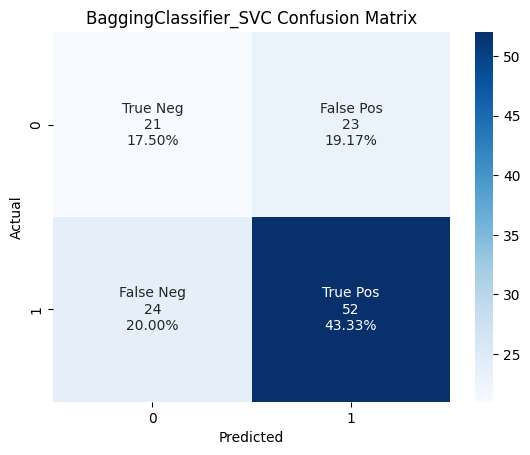

In [82]:
get_confusion_matrices(ensemble_results.loc["BaggingClassifier_SVC"], "../figures/confusion_matricies")

In [154]:
get_confusion_matrices(ensemble_results)

TypeError: get_confusion_matrices() missing 1 required positional argument: 'result_dir'

### Get hypperparams for best models

In [156]:
# get best model hyperparams table by validation score

model_hyperparams_best_validation = model_results[["Best Estimator", "Validation Score", "CV Train Mean", "Y Val (Validation)", "Y Pred (Validation)"]].reset_index().rename(columns={"index":'model'})
model_hyperparams["Diff"] = np.abs(model_hyperparams["CV Train Mean"] - model_hyperparams["Validation Score"]) 
# print(model_hyperparams_best_validation.dtypes)
model_hyperparams_best_validation = model_hyperparams_best_validation.sort_values(by="Validation Score", ascending=False).drop_duplicates(subset=['model'], keep='first')
model_hyperparams_best_validation["Best Estimator"] = model_hyperparams_best_validation["Best Estimator"].str.replace('\n', '').astype(str)
model_hyperparams_best_validation
# might need to reset_index below
# model_hyperparams_best_validation = model_hyperparams_best_validation
# model_hyperparams_best_validation
# print(tabulate(model_hyperparams_best_validation.values, headers=model_hyperparams_best_validation.columns, tablefmt='latex'))


,model,Best Estimator,Validation Score,CV Train Mean,Y Val (Validation),Y Pred (Validation)
35,LinearTreeClassifier,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f7bf75e7a30>), ('model', LinearTreeClassifier(base_estimator=LogisticRegression(max_iter=2000, random_state=42, solver='saga')))])",0.941176,0.952177,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 1 0 1 0 1]
11,MLPClassifier,"Pipeline(steps=[('scaler', None), ('selector', None), ('model', MLPClassifier(activation='tanh', alpha=1e-05, hidden_layer_sizes=(10,), learning_rate_init=0.0001, max_iter=1000, random_state=42))])",0.842105,0.746922,[1 0 1 1 1 1 0 1 0 1 0 1],[1 0 1 1 1 1 1 1 1 1 1 1]
39,LinearForestClassifier,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f7bf748bfa0>), ('model', LinearForestClassifier(base_estimator=LinearRegression(), max_features='sqrt', min_samples_leaf=4, n_estimators=10, random_state=42))])",0.823529,0.937608,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 0 1 1 1 1 1 0]
7,LogisticRegression,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f7b44610850>), ('model', LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42, solver='saga'))])",0.800000,0.687892,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1]
15,RandomForestClassifier,"Pipeline(steps=[('scaler', None), ('selector', SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42))), ('model', RandomForestClassifier(max_depth=1, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42))])",0.800000,0.849176,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1]
3,DecisionTreeClassifier,"Pipeline(steps=[('scaler', None), ('selector', None), ('model', DecisionTreeClassifier(max_depth=1, max_features='log2', min_samples_split=9, random_state=42))])",0.800000,0.784838,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 1]
23,XGBClassifier,"Pipeline(steps=[('scaler', RobustScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f91043e87c0>), ('model', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=0.5, early_stopping_rounds=None, enable_categorical=False, eval_metric=None, feature_types=None, gamma=0, gpu_id=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.01, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=5, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, n_estimators=200, n_jobs=None, num_parallel_tree=None, predictor=None, random_state=42, ...))])",0.800000,0.966854,[1 1 0 1 0 0 1 0 1 1 1 0],[0 1 0 1 1 0 1 1 1 1 1 0]
31,ElasticNet,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', SelectFromModel(estimator=ExtraTreesClassifier(random_state=42))), ('model', LogisticRegression(l1_ratio=0.7, max_iter=1000, penalty='elasticnet', random_state=42, solver='saga'))])",0.777778,0.717665,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 0 1 1 1 1 0]
27,LGBMClassifier,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42))), ('model', LGBMClassifier(boosting_type='dart', colsample_bytree=0.5, learning_rate=0.05, max_depth=3, min_child_samples=5, num_leaves=20, random_state=42, subsample=0.5))])",0.777778,0.885406,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 0 1 1 1 1]
19,SVC,"Pipeline(steps=[('scaler', RobustScaler()), ('selector', None), ('model', SVC(C=5, kernel='poly', random_state=42))])",0.777778,0.605140,[1 0 1 1 1 1 0 1 0 1 0 1],[1 0 1 1 1 1 1 0 1 1 1 1]


### Get single best models

In [37]:
single_best_model_results = model_results[["Validation Score", "CV Train Mean", "CV Train STD", "CV Test Mean", "CV Test STD", "Y Val (Validation)", "Y Pred (Validation)", "Best Estimator"]].reset_index().rename(columns={"index":'model'})
single_best_model_results = single_best_model_results.drop(columns=["Best Estimator"])
single_best_model_results = single_best_model_results.sort_values(by="Validation Score", ascending=False).drop_duplicates(subset=['model'], keep='first')
single_best_model_results = single_best_model_results.set_index("model")
single_best_model_results.loc["mean"] = single_best_model_results.mean()
single_best_model_results = single_best_model_results.round(3).reset_index()
single_best_model_results.columns = ["Model", "Val F1", "Train F1", "Train STD", "Test F1", "Test STD", "Y True", "Y Pred"]
display(single_best_model_results)
print(tabulate(single_best_model_results.values, headers=single_best_model_results.columns, tablefmt='latex'))

,Model,Val F1,Train F1,Train STD,Test F1,Test STD,Y True,Y Pred
0,LinearTreeClassifier,0.941,0.952,0.009,0.535,0.148,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 1 0 1 0 1]
1,DecisionTreeClassifier,0.875,0.724,0.076,0.493,0.169,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 0 1 0 1 1 1 1 1 1 0]
2,MLPClassifier,0.842,0.747,0.080,0.509,0.152,[1 0 1 1 1 1 0 1 0 1 0 1],[1 0 1 1 1 1 1 1 1 1 1 1]
3,LinearForestClassifier,0.824,0.938,0.013,0.619,0.108,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 0 1 1 1 1 1 0]
4,RandomForestClassifier,0.800,0.843,0.021,0.551,0.163,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1]
5,LogisticRegression,0.800,0.688,0.025,0.536,0.114,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1]
6,XGBClassifier,0.800,0.967,0.006,0.647,0.101,[1 1 0 1 0 0 1 0 1 1 1 0],[0 1 0 1 1 0 1 1 1 1 1 0]
7,LGBMClassifier,0.778,0.885,0.021,0.466,0.173,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 0 1 1 1 1]
8,SVC,0.778,0.605,0.022,0.464,0.080,[1 0 1 1 1 1 0 1 0 1 0 1],[1 0 1 1 1 1 1 0 1 1 1 1]
9,ElasticNet,0.778,0.718,0.021,0.661,0.088,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 0 1 1 1 1 0]


\begin{tabular}{lrrrrrll}
\hline
 Model                  &   Val F1 &   Train F1 &   Train STD &   Test F1 &   Test STD & Y True                    & Y Pred                    \\
\hline
 LinearTreeClassifier   &    0.941 &      0.952 &       0.009 &     0.535 &      0.148 & [1 0 1 1 1 1 0 1 0 1 0 1] & [1 1 1 1 1 1 0 1 0 1 0 1] \\
 DecisionTreeClassifier &    0.875 &      0.724 &       0.076 &     0.493 &      0.169 & [1 1 0 1 0 0 1 0 1 1 1 0] & [1 1 0 1 0 1 1 1 1 1 1 0] \\
 MLPClassifier          &    0.842 &      0.747 &       0.08  &     0.509 &      0.152 & [1 0 1 1 1 1 0 1 0 1 0 1] & [1 0 1 1 1 1 1 1 1 1 1 1] \\
 LinearForestClassifier &    0.824 &      0.938 &       0.013 &     0.619 &      0.108 & [1 1 0 1 0 0 1 0 1 1 1 0] & [1 1 1 1 1 0 1 1 1 1 1 0] \\
 RandomForestClassifier &    0.8   &      0.843 &       0.021 &     0.551 &      0.163 & [1 0 1 1 1 1 0 1 0 1 0 1] & [1 1 1 1 1 1 1 1 1 1 1 1] \\
 LogisticRegression     &    0.8   &      0.688 &       0.025 &     0.536 &      0.1

models:  Index(['LinearTreeClassifier', 'MLPClassifier', 'LinearForestClassifier',
       'LogisticRegression', 'RandomForestClassifier',
       'DecisionTreeClassifier', 'XGBClassifier', 'ElasticNet',
       'LGBMClassifier', 'SVC'],
      dtype='object', name='model')


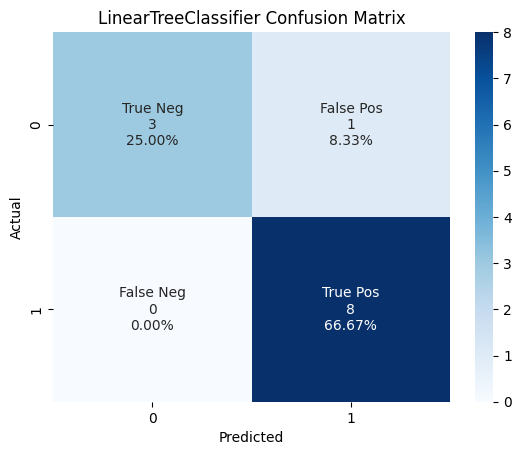

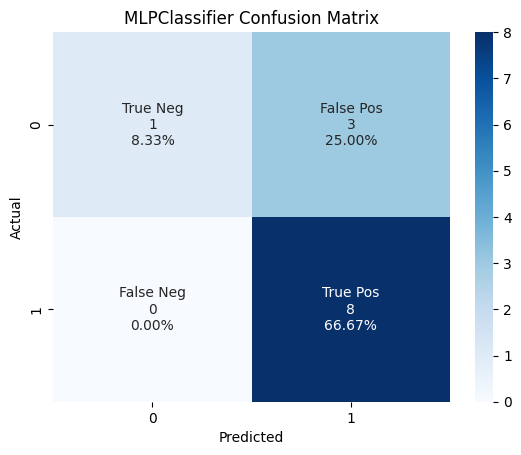

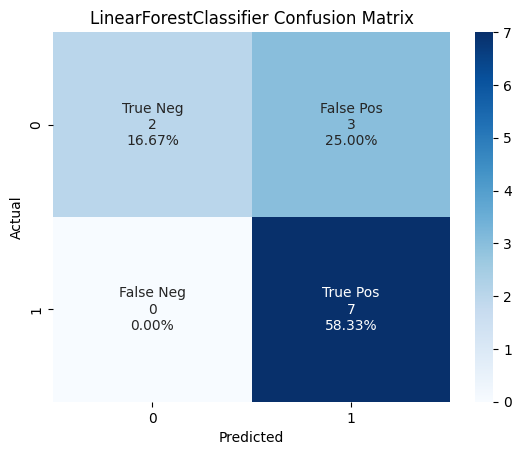

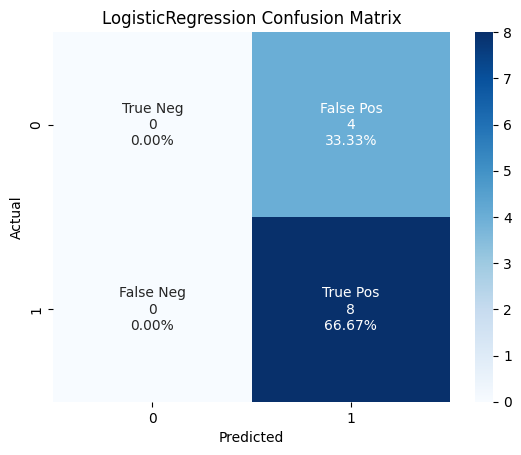

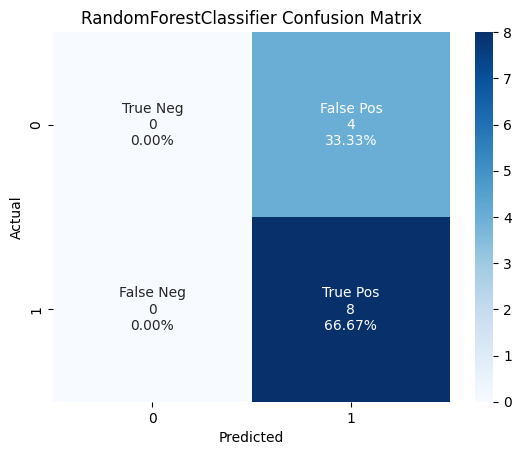

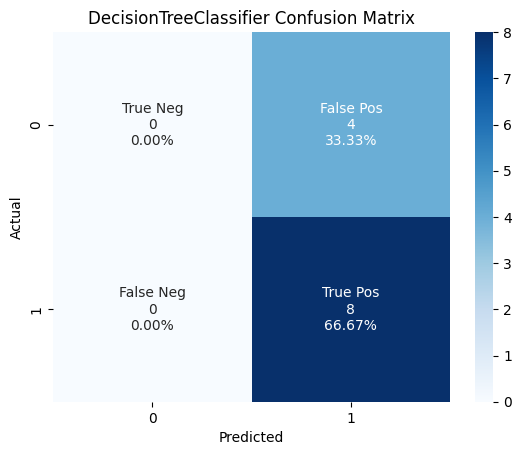

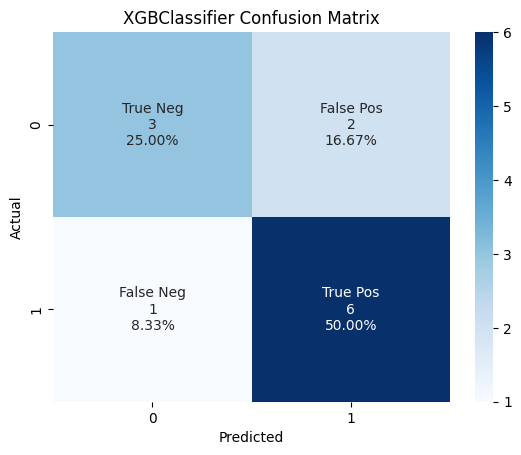

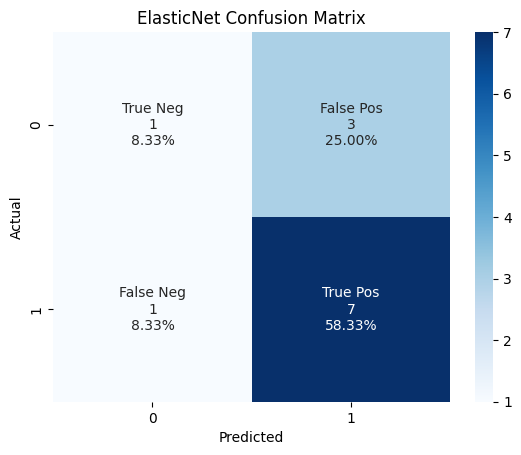

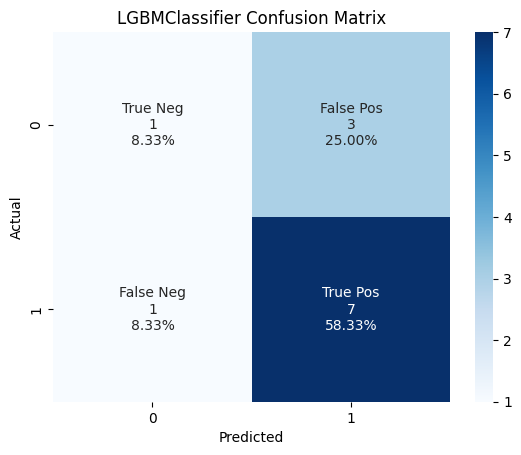

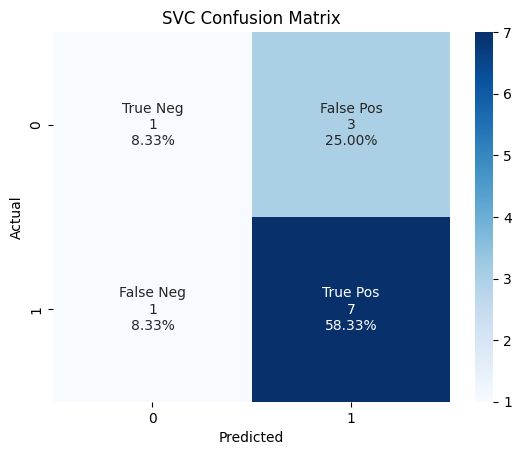

In [157]:
# get confusion matrices for single best validation results
result_dir = "../figures/single_trial_confusion_matricies"

get_confusion_matrices(model_hyperparams_best_validation.set_index("model"), result_dir=result_dir)

In [24]:
# get best model hyperparams table 

model_hyperparams = model_results[["Best Estimator", "Validation Score", "CV Train Mean"]]
model_hyperparams["Diff"] = np.abs(model_hyperparams["CV Train Mean"] - model_hyperparams["Validation Score"]) 
model_hyperparams.sort_values(by="Diff")

KeyError: "['Validation Score', 'CV Train Mean'] not in index"

### Get full table w/ Precision, Recall, F1

In [112]:
avg_model_results = pd.read_excel("../mean_results/avg_model_results_80_20_optimize_F1.xlsx").rename(columns={"Unnamed: 0" : "Model"}).drop(columns=["Mean Best Score", "Mean CV Test F1", "Mean CV Test Precision", "Mean CV Test Recall", "Mean Validation F1 STD", "Mean Seed"])
avg_model_results.columns = [col.replace("Mean", "").replace("Validation", "Generalization").lstrip() for col in avg_model_results.columns]
# avg_model_results.index = list(map(lambda x: x.replace("BaggingClassifier", "Bagging").replace("AdaBoostClassifier", "AdaBoost").replace("_", "-"), avg_model_results.index))
avg_model_results = avg_model_results.set_index("Model") 
avg_model_results.loc["Mean"] = avg_model_results.mean()
avg_model_results = avg_model_results.round(3)

# Create hierarchy of columns
print(avg_model_results.columns)
cv_train_cols = avg_model_results.columns[avg_model_results.columns.str.startswith("CV")]
generalization_cols = avg_model_results.columns[avg_model_results.columns.str.startswith("Generalization")]

col_tuples = [('CV Train', col.replace("CV Train", "")) for col in cv_train_cols] + [('Generalization', col.replace("Generalization", "")) for col in generalization_cols]
avg_model_results.columns = pd.MultiIndex.from_tuples(col_tuples, names=['source', 'Metric'])
display(avg_model_results)
print(avg_model_results.to_latex())

Index(['CV Train F1', 'Generalization F1', 'CV Train Precision',
       'Generalization Precision', 'CV Train Recall', 'Generalization Recall'],
      dtype='object')


source                 CV Train                    Generalization             \
Metric                       F1  Precision  Recall             F1  Precision   
Model                                                                          
XGBClassifier             0.732      0.770   0.578          0.633      1.000   
RandomForestClassifier    0.799      0.754   0.774          0.672      0.845   
LogisticRegression        0.696      0.717   0.676          0.655      0.736   
MLPClassifier             0.715      0.703   0.703          0.646      0.775   
DecisionTreeClassifier    0.749      0.667   0.801          0.683      0.712   
ElasticNet                0.686      0.666   0.744          0.708      0.639   
LGBMClassifier            0.702      0.655   0.700          0.661      0.726   
LinearBoostClassifier     0.755      0.641   0.807          0.661      0.711   
LinearTreeClassifier      0.726      0.621   0.783          0.644      0.677   
SVC                       0.730      0.593   0.675          0.522      0.844   
Mean                      0.729      0.679   0.724          0.649      0.767   

source                          
Metric                  Recall  
Model                           
XGBClassifier            1.000  
RandomForestClassifier   0.912  
LogisticRegression       0.895  
MLPClassifier            0.831  
DecisionTreeClassifier   0.661  
ElasticNet               0.669  
LGBMClassifier           0.667  
LinearBoostClassifier    0.641  
LinearTreeClassifier     0.620  
SVC                      0.722  
Mean                     0.762

\begin{tabular}{lrrrrrr}
\toprule
source & \multicolumn{3}{l}{CV Train} & \multicolumn{3}{l}{Generalization} \\
Metric &       F1 &  Precision &  Recall &             F1 &  Precision &  Recall \\
Model                  &          &            &         &                &            &         \\
\midrule
XGBClassifier          &    0.732 &      0.770 &   0.578 &          0.633 &      1.000 &   1.000 \\
RandomForestClassifier &    0.799 &      0.754 &   0.774 &          0.672 &      0.845 &   0.912 \\
LogisticRegression     &    0.696 &      0.717 &   0.676 &          0.655 &      0.736 &   0.895 \\
MLPClassifier          &    0.715 &      0.703 &   0.703 &          0.646 &      0.775 &   0.831 \\
DecisionTreeClassifier &    0.749 &      0.667 &   0.801 &          0.683 &      0.712 &   0.661 \\
ElasticNet             &    0.686 &      0.666 &   0.744 &          0.708 &      0.639 &   0.669 \\
LGBMClassifier         &    0.702 &      0.655 &   0.700 &          0.661 &      0.726 &   0.66

In [113]:
avg_ensemble_results = pd.read_excel("../mean_results/avg_ensemble_results_80_20_optimize_F1.xlsx").rename(columns={"Unnamed: 0" : "Model"}).drop(columns=["Mean Best Score", "Mean CV Test F1", "Mean CV Test Precision", "Mean CV Test Recall", "Mean Validation F1 STD", "Mean Seed"])
avg_ensemble_results.columns = [col.replace("Mean", "").replace("Validation", "Generalization").lstrip() for col in avg_ensemble_results.columns]
# avg_model_results.index = list(map(lambda x: x.replace("BaggingClassifier", "Bagging").replace("AdaBoostClassifier", "AdaBoost").replace("_", "-"), avg_model_results.index))
avg_ensemble_results = avg_ensemble_results.set_index("Model") 
avg_ensemble_results.loc["Mean"] = avg_ensemble_results.mean()
avg_ensemble_results = avg_ensemble_results.round(3)

# Create hierarchy of columns
cv_train_cols = avg_ensemble_results.columns[avg_ensemble_results.columns.str.startswith("CV")]
generalization_cols = avg_ensemble_results.columns[avg_ensemble_results.columns.str.startswith("Generalization")]

col_tuples = [('CV Train', col.replace("CV Train", "")) for col in cv_train_cols] + [('Generalization', col.replace("Generalization", "")) for col in generalization_cols]
avg_ensemble_results.columns = pd.MultiIndex.from_tuples(col_tuples, names=['source', 'Metric'])
display(avg_ensemble_results)
print(avg_ensemble_results.to_latex())

source                                    CV Train                     \
Metric                                          F1  Precision  Recall   
Model                                                                   
BaggingClassifier_RandomForestClassifier     0.779      0.751   0.745   
AdaBoostClassifier_ElasticNet                0.606      0.730   0.515   
BaggingClassifier_MLPClassifier              0.778      0.722   0.750   
BaggingClassifier_ElasticNet                 0.711      0.719   0.695   
AdaBoostClassifier_LogisticRegression        0.449      0.716   0.455   
AdaBoostClassifier_RandomForestClassifier    0.975      0.692   0.973   
BaggingClassifier_SVC                        0.679      0.688   0.812   
BaggingClassifier_LogisticRegression         0.377      0.687   0.325   
BaggingClassifier_LGBMClassifier             0.873      0.658   0.895   
AdaBoostClassifier_LGBMClassifier            0.964      0.634   0.974   
BaggingClassifier_DecisionTreeClassifier     0.819      0.630   0.853   
AdaBoostClassifier_DecisionTreeClassifier    0.908      0.573   0.985   
Mean                                         0.743      0.683   0.748   

source                                    Generalization                     
Metric                                                F1  Precision  Recall  
Model                                                                        
BaggingClassifier_RandomForestClassifier           0.652      0.835   0.924  
AdaBoostClassifier_ElasticNet                      0.625      0.773   0.926  
BaggingClassifier_MLPClassifier                    0.635      0.850   0.905  
BaggingClassifier_ElasticNet                       0.663      0.756   0.882  
AdaBoostClassifier_LogisticRegression              0.691      0.464   0.808  
AdaBoostClassifier_RandomForestClassifier          0.686      0.977   0.748  
BaggingClassifier_SVC                              0.714      0.606   0.703  
BaggingClassifier_LogisticRegression               0.737      0.481   0.663  
BaggingClassifier_LGBMClassifier                   0.664      0.858   0.672  
AdaBoostClassifier_LGBMClassifier                  0.636      0.954   0.647  
BaggingClassifier_DecisionTreeClassifier           0.588      0.799   0.683  
AdaBoostClassifier_DecisionTreeClassifier          0.614      0.845   0.544  
Mean                                               0.659      0.766   0.759

\begin{tabular}{lrrrrrr}
\toprule
source & \multicolumn{3}{l}{CV Train} & \multicolumn{3}{l}{Generalization} \\
Metric &       F1 &  Precision &  Recall &             F1 &  Precision &  Recall \\
Model                                     &          &            &         &                &            &         \\
\midrule
BaggingClassifier\_RandomForestClassifier  &    0.779 &      0.751 &   0.745 &          0.652 &      0.835 &   0.924 \\
AdaBoostClassifier\_ElasticNet             &    0.606 &      0.730 &   0.515 &          0.625 &      0.773 &   0.926 \\
BaggingClassifier\_MLPClassifier           &    0.778 &      0.722 &   0.750 &          0.635 &      0.850 &   0.905 \\
BaggingClassifier\_ElasticNet              &    0.711 &      0.719 &   0.695 &          0.663 &      0.756 &   0.882 \\
AdaBoostClassifier\_LogisticRegression     &    0.449 &      0.716 &   0.455 &          0.691 &      0.464 &   0.808 \\
AdaBoostClassifier\_RandomForestClassifier &    0.975 &      0.692 &   0.973

In [46]:
model_names = avg_model_results.index.tolist()
avg_model_results = avg_model_results[["Mean Validation Score", "Mean Validation STD","Mean CV Train Mean", "Mean CV Test Mean"]]
avg_model_results.columns = ["Val F1", "Val STD","Train F1", "Test F1"]
# rename the index
avg_model_results.index.name = "Model"

# sort the rows by descending order of Test F1
avg_model_results = avg_model_results.sort_values(by="Test F1", ascending=False)

# round to 3 decimal places
avg_model_results = avg_model_results.round(3)

# create the latex table
latex_table = avg_model_results.to_latex(
    float_format="{:.3f}".format, 
    index=True, 
    index_names=True, 
    header=["Train F1", "Test F1", "Val F1", "Val STD"],
    column_format="lrrrr",
    caption="Ensemble model results using bagging and AdaBoost algorithms.",
    label="tab:ensemble results"
)

# add necessary latex packages and commands
latex_table = "\\FloatBarrier\n" + latex_table
latex_table = latex_table.replace("\\begin{tabular}", "\\begin{tabular}{lrrrr}\n\\toprule\n")
latex_table = latex_table.replace("\\end{tabular}", "\n\\bottomrule\n\\end{tabular}")
latex_table = latex_table.replace("\\toprule\n  Model &", "  \\textbf{Model} &")
latex_table = latex_table.replace("\\midrule", "\\hline\n\\midrule")
latex_table = latex_table.replace("\\bottomrule\n", "\\hline\n\\bottomrule\n\\hline\n")

# display the latex table
print(latex_table)


\FloatBarrier
\begin{table}
\centering
\caption{Ensemble model results using bagging and AdaBoost algorithms.}
\label{tab:ensemble results}
\begin{tabular}{lrrrr}
\toprule
{lrrrr}
\toprule
{} & Train F1 & Test F1 & Val F1 & Val STD \\
Model                  &          &         &        &         \\
\hline
\midrule
RandomForestClassifier &    0.702 &   0.087 &  0.851 &   0.652 \\
XGBClassifier          &    0.716 &   0.103 &  0.975 &   0.613 \\
LinearForestClassifier &    0.697 &   0.119 &  0.949 &   0.606 \\
LogisticRegression     &    0.708 &   0.089 &  0.678 &   0.596 \\
ElasticNet             &    0.726 &   0.095 &  0.626 &   0.595 \\
LinearTreeClassifier   &    0.688 &   0.175 &  0.953 &   0.589 \\
SVC                    &    0.674 &   0.085 &  0.670 &   0.569 \\
LGBMClassifier         &    0.741 &   0.026 &  0.883 &   0.569 \\
MLPClassifier          &    0.696 &   0.117 &  0.727 &   0.549 \\
DecisionTreeClassifier &    0.742 &   0.103 &  0.786 &   0.528 \\
\hline
\bottomrule
\hli

In [ ]:
print(avg_model_results.style.to_latex())

In [ ]:


# create a custom style for the dataframe
def highlight_best(s):
    is_best = s == s.max()
    return ['font-weight: bold' if v else '' for v in is_best]

style = avg_model_results.style

latex_table = (r'\begin{table}[ht]' + '\n' +
               r'\begin{tabular}{lrrrr}' + '\n' +
               r'\toprule' + '\n' +
               r'Model & Mean Validation Score & Mean CV Train Mean & Mean CV Test Mean & Mean Validation Z Score' + '\n' + 
               r'\midrule' + '\n' +

               r'paste your latex table here' + '\n' +
               
               r'\end{tabular}' + '\n' +
               r'\caption{Results after implementing Bagged and Boosted version of each model and performing tuning}' + '\n' +
               r'\end{table}')

print(latex_table)

In [ ]:
pd.DataFrame(avg_ensemble_results["Mean Validation Score"]).style.to_latex()